## Integrated Assigment

### Introduction

The online retail business has grown a lot in recently. The recommendation system 
assists in the indication of products for the online retail business where the purchase 
of other users is analysed and items to indicate to potential buyers. 
This project consists of analyse the recommendation system for books and the market 
basket for groceries. 


In [1]:
#pip install geopy

In [2]:
# Importing the libraries

import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import folium
from folium import plugins
import numpy as np
import ipywidgets as widgets
from ipywidgets import Layout
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from geopy.point import Point
import os
import re
import requests
import io
from io import BytesIO
from PIL import Image, ImageFile
import PIL
from PIL import UnidentifiedImageError
import glob
import seaborn as sns
import random
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.neighbors import NearestNeighbors
from scipy.spatial.distance import correlation
from sklearn.metrics.pairwise import pairwise_distances
from IPython.display import display, clear_output
from contextlib import contextmanager
import sys
from scipy.sparse import csr_matrix
import param
import panel as pn
import hvplot.pandas
from panel.interact import interact
import datetime
from datetime import date
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import networkx as nx
import scipy
import math
import sklearn
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.sparse.linalg import svds
from surprise import Dataset, Reader
from surprise import SVD, NMF
from surprise.model_selection import cross_validate, train_test_split, GridSearchCV
import holoviews as hv
import matplotlib
import squarify
from IPython.display import HTML

pn.extension('ipywidgets')

## Data Understanding

There are three files in the Book-Crossing dataset:

•	User: Contains data about the user such as age and location.

•	Books: The Books are recognize using the appropriate ISBN. The content-based data from Amazon Web Services is provided (Book-Title, Book-Author, Year-Of-Publication, Publisher) and the URLs (Image-URL-S, Image-URL-M, and Image-URL-L), small, medium, and big, are provided that link to cover images. These domain names lead to the Amazon website.


In [3]:
# Reading the dataset - book information
bx_books=pd.read_csv('BX-Books.csv', sep=';', encoding="latin-1", error_bad_lines=False, escapechar='\\')

In [4]:
# Observing a sample of the dataset
bx_books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [5]:
# Reading the dataset - rating 
bx_rating=pd.read_csv('BX-Book-Ratings.csv', sep=';', encoding="latin-1", error_bad_lines=False, escapechar='\\')

In [6]:
# Observing a sample of the dataset
bx_rating.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [7]:
# Reading the dataset - User
bx_users=pd.read_csv('BX-Users.csv', sep=';', encoding="latin-1", error_bad_lines=False, escapechar='\\')

In [8]:
# Observing a sample of the dataset
bx_users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [9]:
# Merging the datasets User and Rating by User ID
bx_rating_users = pd.merge(bx_rating, bx_users, on=['User-ID' ], how='left')

In [10]:
# Observing a sample of the dataset
bx_rating_users.head()

,User-ID,ISBN,Book-Rating,Location,Age
0,276725,034545104X,0,"tyler, texas, usa",NaN
1,276726,0155061224,5,"seattle, washington, usa",NaN
2,276727,0446520802,0,"h, new south wales, australia",16.0
3,276729,052165615X,3,"rijeka, n/a, croatia",16.0
4,276729,0521795028,6,"rijeka, n/a, croatia",16.0


In [11]:
# Merging the datasets Rating/User and Book by ISBN
df_books = pd.merge(bx_books, bx_rating_users, on=['ISBN' ], how='inner')

In [12]:
#Renaming the columns
df_books.rename(columns={'Book-Title' : 'Book_Title', 'Book-Author' : 'Book_Author',
                          'Year-Of-Publication' : 'Year_Publication','Image-URL-S' : 'Image_URL_S ',
                          'Image-URL-M' : 'Image_URL_M', 'Image-URL-L' : 'Image_URL_L', 'User-ID' : 'User_ID',
                          'Book-Rating' : 'Book_Rating'}, inplace=True)

In [13]:
# Observing a sample of the dataset
df_books.head()

,ISBN,Book_Title,Book_Author,Year_Publication,Publisher,Image_URL_S,Image_URL_M,Image_URL_L,User_ID,Book_Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,"ottawa, ontario, canada",49.0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,41385,0,"sudbury, ontario, canada",NaN


In [14]:
# verify if the data set has missing values
df_books.isna().sum()

ISBN                     0
Book_Title               0
Book_Author              1
Year_Publication         0
Publisher                2
Image_URL_S              0
Image_URL_M              0
Image_URL_L              0
User_ID                  0
Book_Rating              0
Location                 0
Age                 277845
dtype: int64

In [15]:
# verify if the data set has duplicate rows
duplicate_rows_df = df_books[df_books.duplicated()]
print("number of duplicate rows:", duplicate_rows_df.shape)

number of duplicate rows: (0, 12)


### Data Preparation

The data preparation for the book dataset took some steps.

First, we had to join the three datasets that were separated. With the dataset grouped, some exploratory analyses were carried out in which it was identified that the location variable presented the concatenated address, some observations presented the complete address, others presented the city, state and country. This information was separated by a comma, so the split command was used to separate the information into columns.

To include the geolocation information (latitude and longitude), the geopy package was used, in which the geolocation information can be loaded through the address. As the same country was written differently, in order to maintain a standard, the geopy reversing command was used, where the country information is obtained through latitude and longitude information.
The feature Age presents missing values and some values less than 10 and more than 10. The missing values were filled in with the median of the age for the specific book, after that the missing values that were not filled and the values less than 10 and more than 100 were dropped.


In [16]:
# New Data with Split of column "Location" delimited by comma
new = df_books["Location"].str.split(", ", n = 6, expand = True)

df_books["city"]= new[0] 

df_books["state"]= new[1] 

df_books["country"]= new[2] 

df_books["country1"]= new[3] 

df_books["country2"]= new[4] 

df_books["country3"]= new[5] 

df_books["country4"]= new[6] 

new

,0,1,2,3,4,5,6
0,stockton,california,usa,None,None,None,None
1,timmins,ontario,canada,None,None,None,None
2,ottawa,ontario,canada,None,None,None,None
3,n/a,n/a,n/a,None,None,None,None
4,sudbury,ontario,canada,None,None,None,None
...,...,...,...,...,...,...,...
1031170,providence,rhode island,usa,None,None,None,None
1031171,orem,utah,usa,None,None,None,None
1031172,hopewell junction,new york,usa,None,None,None,None
1031173,hopewell junction,new york,usa,None,None,None,None


In [17]:
# Function for fill the country 
def fill_country(row):
    if row.country4 != None:
        return row.country4
    elif row.country3 != None and row.country4 == None:
        return row.country3
    elif row.country2 != None and row.country3 == None and row.country4 == None:
        return row.country2
    elif row.country1 != None and row.country2 == None and row.country3 == None and row.country4 == None:
        return row.country1
    else:
        return row.country
    
df_books['Country'] = df_books.apply(fill_country, axis=1)
df_books.head()

,ISBN,Book_Title,Book_Author,Year_Publication,Publisher,Image_URL_S,Image_URL_M,Image_URL_L,User_ID,Book_Rating,Location,Age,city,state,country,country1,country2,country3,country4,Country
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0,stockton,california,usa,None,None,None,None,usa
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN,timmins,ontario,canada,None,None,None,None,canada
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,"ottawa, ontario, canada",49.0,ottawa,ontario,canada,None,None,None,None,canada
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN,n/a,n/a,n/a,None,None,None,None,n/a
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,41385,0,"sudbury, ontario, canada",NaN,sudbury,ontario,canada,None,None,None,None,canada


In [18]:
# Capitalizing the first letter
df_books["Country"] = df_books["Country"].str.capitalize()

In [19]:
# Capitalizing the first letter
df_books["city"] = df_books["city"].str.capitalize()

In [20]:
# Capitalizing the first letter
df_books["state"] = df_books["state"].str.capitalize()

In [21]:
# Correcting some observations with spelling errors

df_books['Country'] = df_books['Country'].replace(r'N/a', None)
df_books['Country'] = df_books['Country'].replace(r'N.a.', None)
df_books['Country'] = df_books['Country'].replace(r'n.a.', None)
df_books['Country'] = df_books['Country'].replace(r'n/a', None)
df_books['Country'] = df_books['Country'].replace(r'The world tomorrow', None)
df_books['Country'] = df_books['Country'].replace(r'Usa', 'United States')
df_books['Country'] = df_books['Country'].replace(r'United staes', 'United States')
df_books['Country'] = df_books['Country'].replace(r'United state', 'United States')
df_books['Country'] = df_books['Country'].replace(r'United sates', 'United States')
df_books['Country'] = df_books['Country'].replace(r'Los estados unidos de norte america', 'United States')
df_books['Country'] = df_books['Country'].replace(r'Disgruntled states of america', 'United States')
df_books['Country'] = df_books['Country'].replace(r'Usa & canada', 'United States')
df_books['Country'] = df_books['Country'].replace(r'Usa (currently living in england)', 'United States')
df_books['Country'] = df_books['Country'].replace(r'United kindgonm', 'United Kingdom')

In [22]:
# Filling missig values with 0
df_books['Age'].fillna(0, inplace=True)

In [23]:
#pivot table to calculate the median age by book title
impute_age = df_books.pivot_table(values=["Age"], index=['Book_Title'], aggfunc=np.median)

In [24]:
#interation for missing age with median age by book title
for i,row in df_books.loc[df_books['Age'].isnull(),:].iterrows():
    ind = tuple([row['Book_Title']])
    df_books.loc[i,'Age'] = impute_age.loc[ind].values[0]

In [25]:
df_books = df_books[(df_books['Age'] >= 10) & (df_books['Age'] <=100)]

In [26]:
age_range = [0, 20, 40, 65, 100]
labels = ['20-', '20 to 40', '40 to 65', '65+']

In [27]:
age_range = pd.cut(x=df_books.Age, bins=age_range, labels=labels)

In [28]:
df_books['age_range'] = age_range
df_books.head()

,ISBN,Book_Title,Book_Author,Year_Publication,Publisher,Image_URL_S,Image_URL_M,Image_URL_L,User_ID,Book_Rating,...,Age,city,state,country,country1,country2,country3,country4,Country,age_range
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,...,18.0,Stockton,California,usa,None,None,None,None,United States,20-
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,...,49.0,Ottawa,Ontario,canada,None,None,None,None,Canada,40 to 65
5,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,67544,8,...,30.0,Toronto,Ontario,canada,None,None,None,None,Canada,20 to 40
6,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,85526,0,...,36.0,Victoria,British columbia,canada,None,None,None,None,Canada,20 to 40
7,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,96054,0,...,29.0,Ottawa,Ontario,canada,None,None,None,None,Canada,20 to 40


In [29]:
#create the new feature loc (location), where it is fill the missing country with city 
def fill_loc(row):
    if row.Country == None:
        return row.city
    else:
        return row.Country
    
df_books['loc'] = df_books.apply(fill_loc, axis=1)
df_books.head()

,ISBN,Book_Title,Book_Author,Year_Publication,Publisher,Image_URL_S,Image_URL_M,Image_URL_L,User_ID,Book_Rating,...,city,state,country,country1,country2,country3,country4,Country,age_range,loc
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,...,Stockton,California,usa,None,None,None,None,United States,20-,United States
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,...,Ottawa,Ontario,canada,None,None,None,None,Canada,40 to 65,Canada
5,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,67544,8,...,Toronto,Ontario,canada,None,None,None,None,Canada,20 to 40,Canada
6,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,85526,0,...,Victoria,British columbia,canada,None,None,None,None,Canada,20 to 40,Canada
7,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,96054,0,...,Ottawa,Ontario,canada,None,None,None,None,Canada,20 to 40,Canada


In [30]:
# Create a dataframe with the loc information
df_loc = pd.DataFrame(df_books['loc'])


In [31]:
# Drop the duplicate
df_loc.drop_duplicates(inplace=True)

In [32]:
# Observing a sample of the dataset
df_loc.head()

,loc
0,United States
2,Canada
40,Seattle
46,Malaysia
93,Finland


In [33]:
# Drop the missing values
df_loc.dropna(inplace=True)

In [34]:
# Include the geolocation information
geolocator = Nominatim(user_agent='geoloc')
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
df_loc['location']=df_loc['loc'].apply(geocode)

RateLimiter caught an error, retrying (0/2 tries). Called with (*('N/a - on the road',), **{}).
Traceback (most recent call last):
  File "C:\Users\vankr\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 449, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\vankr\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 444, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\vankr\anaconda3\lib\http\client.py", line 1377, in getresponse
    response.begin()
  File "C:\Users\vankr\anaconda3\lib\http\client.py", line 320, in begin
    version, status, reason = self._read_status()
  File "C:\Users\vankr\anaconda3\lib\http\client.py", line 281, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\vankr\anaconda3\lib\socket.py", line 704, in readinto
    return self._sock.recv_into(b)
  File "C:\Users\vankr\anaconda3\lib\ssl.py", line 1242, in recv_into
    r

RateLimiter swallowed an error after 2 retries. Called with (*('N/a - on the road',), **{}).
Traceback (most recent call last):
  File "C:\Users\vankr\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 449, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\vankr\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 444, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\vankr\anaconda3\lib\http\client.py", line 1377, in getresponse
    response.begin()
  File "C:\Users\vankr\anaconda3\lib\http\client.py", line 320, in begin
    version, status, reason = self._read_status()
  File "C:\Users\vankr\anaconda3\lib\http\client.py", line 281, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\vankr\anaconda3\lib\socket.py", line 704, in readinto
    return self._sock.recv_into(b)
  File "C:\Users\vankr\anaconda3\lib\ssl.py", line 1242, in recv_into
    retu

In [35]:
df_loc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 934 entries, 0 to 1028973
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   loc       934 non-null    object
 1   location  922 non-null    object
dtypes: object(2)
memory usage: 21.9+ KB


In [36]:
# Ceating the features with latitude and longitude information
df_loc['Lat'] = df_loc['location'].apply(lambda loc: loc.latitude if loc else None)
df_loc['Long'] = df_loc['location'].apply(lambda loc: loc.longitude if loc else None)

In [37]:
df_loc.head()

,loc,location,Lat,Long
0,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882
2,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707
40,Seattle,"(Seattle, King County, Washington, United Stat...",47.603832,-122.330062
46,Malaysia,"(Malaysia, (4.5693754, 102.2656823))",4.569375,102.265682
93,Finland,"(Suomi / Finland, (63.2467777, 25.9209164))",63.246778,25.920916


In [38]:
# Get the country information from Latitude and longitude to have a standard spelling
reverse = RateLimiter(geolocator.reverse, min_delay_seconds=1)
def reverse_geocoding(lat, lon):
    try:
        location = geolocator.reverse(Point(lat, lon), language='en')
        return location.raw['address']['country']
    except:
        return None

df_loc['country'] = np.vectorize(reverse_geocoding)(df_loc['Lat'], df_loc['Long'])

In [39]:
df_loc.head()

,loc,location,Lat,Long,country
0,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882,United States
2,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707,Canada
40,Seattle,"(Seattle, King County, Washington, United Stat...",47.603832,-122.330062,United States
46,Malaysia,"(Malaysia, (4.5693754, 102.2656823))",4.569375,102.265682,Malaysia
93,Finland,"(Suomi / Finland, (63.2467777, 25.9209164))",63.246778,25.920916,Finland


In [40]:
df_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 745777 entries, 0 to 1031174
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   ISBN              745777 non-null  object  
 1   Book_Title        745777 non-null  object  
 2   Book_Author       745776 non-null  object  
 3   Year_Publication  745777 non-null  int64   
 4   Publisher         745775 non-null  object  
 5   Image_URL_S       745777 non-null  object  
 6   Image_URL_M       745777 non-null  object  
 7   Image_URL_L       745777 non-null  object  
 8   User_ID           745777 non-null  int64   
 9   Book_Rating       745777 non-null  int64   
 10  Location          745777 non-null  object  
 11  Age               745777 non-null  float64 
 12  city              745777 non-null  object  
 13  state             745777 non-null  object  
 14  country           735222 non-null  object  
 15  country1          1902 non-null    object  
 16  c

In [41]:
# Drop the unecessary columns
df_books.drop(columns=['country', 'country1', 'country2', 'country3', 'country4', 'city', 'state', 'Country', 'Location'], inplace=True)

In [42]:
df_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 745777 entries, 0 to 1031174
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   ISBN              745777 non-null  object  
 1   Book_Title        745777 non-null  object  
 2   Book_Author       745776 non-null  object  
 3   Year_Publication  745777 non-null  int64   
 4   Publisher         745775 non-null  object  
 5   Image_URL_S       745777 non-null  object  
 6   Image_URL_M       745777 non-null  object  
 7   Image_URL_L       745777 non-null  object  
 8   User_ID           745777 non-null  int64   
 9   Book_Rating       745777 non-null  int64   
 10  Age               745777 non-null  float64 
 11  age_range         745777 non-null  category
 12  loc               745777 non-null  object  
dtypes: category(1), float64(1), int64(3), object(8)
memory usage: 74.7+ MB


In [43]:
# Merging the location informattion with the books dataset
df_books2 = pd.merge(df_books,df_loc, on=['loc' ], how='left')

In [44]:
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 745777 entries, 0 to 745776
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   ISBN              745777 non-null  object  
 1   Book_Title        745777 non-null  object  
 2   Book_Author       745776 non-null  object  
 3   Year_Publication  745777 non-null  int64   
 4   Publisher         745775 non-null  object  
 5   Image_URL_S       745777 non-null  object  
 6   Image_URL_M       745777 non-null  object  
 7   Image_URL_L       745777 non-null  object  
 8   User_ID           745777 non-null  int64   
 9   Book_Rating       745777 non-null  int64   
 10  Age               745777 non-null  float64 
 11  age_range         745777 non-null  category
 12  loc               745777 non-null  object  
 13  location          745685 non-null  object  
 14  Lat               745685 non-null  float64 
 15  Long              745685 non-null  float64 
 16  co

In [45]:
df_books2['country'] = df_books2['country'].replace(r'None', None)

In [46]:
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 745777 entries, 0 to 745776
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   ISBN              745777 non-null  object  
 1   Book_Title        745777 non-null  object  
 2   Book_Author       745776 non-null  object  
 3   Year_Publication  745777 non-null  int64   
 4   Publisher         745775 non-null  object  
 5   Image_URL_S       745777 non-null  object  
 6   Image_URL_M       745777 non-null  object  
 7   Image_URL_L       745777 non-null  object  
 8   User_ID           745777 non-null  int64   
 9   Book_Rating       745777 non-null  int64   
 10  Age               745777 non-null  float64 
 11  age_range         745777 non-null  category
 12  loc               745777 non-null  object  
 13  location          745685 non-null  object  
 14  Lat               745685 non-null  float64 
 15  Long              745685 non-null  float64 
 16  co

In [47]:
#Drop the missing location
df_books2.dropna(subset=['location'], inplace=True)

In [48]:
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 745685 entries, 0 to 745776
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   ISBN              745685 non-null  object  
 1   Book_Title        745685 non-null  object  
 2   Book_Author       745684 non-null  object  
 3   Year_Publication  745685 non-null  int64   
 4   Publisher         745683 non-null  object  
 5   Image_URL_S       745685 non-null  object  
 6   Image_URL_M       745685 non-null  object  
 7   Image_URL_L       745685 non-null  object  
 8   User_ID           745685 non-null  int64   
 9   Book_Rating       745685 non-null  int64   
 10  Age               745685 non-null  float64 
 11  age_range         745685 non-null  category
 12  loc               745685 non-null  object  
 13  location          745685 non-null  object  
 14  Lat               745685 non-null  float64 
 15  Long              745685 non-null  float64 
 16  co

In [49]:
#Observing the dataset sample
df_books2.head()

,ISBN,Book_Title,Book_Author,Year_Publication,Publisher,Image_URL_S,Image_URL_M,Image_URL_L,User_ID,Book_Rating,Age,age_range,loc,location,Lat,Long,country
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,18.0,20-,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882,United States
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,49.0,40 to 65,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707,Canada
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,67544,8,30.0,20 to 40,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707,Canada
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,85526,0,36.0,20 to 40,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707,Canada
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,96054,0,29.0,20 to 40,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707,Canada


In [50]:
#verify the countries
df_books2['country'].unique()

array(['United States', 'Canada', 'Malaysia', 'Finland', 'United Kingdom',
       'Netherlands', 'Portugal', 'Brazil', 'Germany', 'Austria',
       'Australia', 'France', 'Costa Rica', 'Poland', 'Iran', 'Spain',
       'Indonesia', 'India', 'Pakistan', 'Taiwan', 'Singapore',
       'Argentina', 'Italy', 'Romania', 'Greece', 'Ireland',
       'New Zealand', 'Philippines', 'Belgium', 'Mexico', 'South Africa',
       'Burkina Faso', 'Croatia', 'Denmark', 'Cuba', 'Turkey',
       'Switzerland', 'China', 'Japan', 'Qatar', 'Latvia', 'Sweden',
       'Kuwait', 'Nepal', 'Peru', 'Venezuela', 'Slovakia', 'Norway',
       'Dominican Republic', 'Bosnia and Herzegovina', 'South Korea',
       'North Macedonia', 'Kenya', 'Mauritius', 'Nicaragua', 'Nigeria',
       'Madagascar', 'Israel', 'Egypt', 'Lithuania', 'Russia', 'Andorra',
       'Czechia', 'Bulgaria', 'Slovenia', 'Chile', 'Luxembourg',
       'Iceland', 'Honduras', 'Zambia', 'Trinidad and Tobago', 'Belize',
       'Cyprus', 'Mozambique', 'Ca

In [51]:
#Drop the missing
df_books2.dropna(subset=['Book_Author', 'Publisher'], inplace=True)

In [52]:
# Drop rating equal 0
df_books2 = df_books2.loc[df_books2['Book_Rating']!= 0]

In [53]:
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267203 entries, 2 to 745773
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   ISBN              267203 non-null  object  
 1   Book_Title        267203 non-null  object  
 2   Book_Author       267203 non-null  object  
 3   Year_Publication  267203 non-null  int64   
 4   Publisher         267203 non-null  object  
 5   Image_URL_S       267203 non-null  object  
 6   Image_URL_M       267203 non-null  object  
 7   Image_URL_L       267203 non-null  object  
 8   User_ID           267203 non-null  int64   
 9   Book_Rating       267203 non-null  int64   
 10  Age               267203 non-null  float64 
 11  age_range         267203 non-null  category
 12  loc               267203 non-null  object  
 13  location          267203 non-null  object  
 14  Lat               267203 non-null  float64 
 15  Long              267203 non-null  float64 
 16  co

In [54]:
# Create a dataframe with the loc information
df_c = pd.DataFrame(df_books2['country'])
# Drop the duplicate
df_c.drop_duplicates(inplace=True)

In [55]:
# Include the geolocation information
geolocator = Nominatim(user_agent='geoloc')
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
df_c['location']=df_c['country'].apply(geocode)

In [56]:
# Ceating the features with latitude and longitude information
df_c['Lat'] = df_c['location'].apply(lambda loc: loc.latitude if loc else None)
df_c['Long'] = df_c['location'].apply(lambda loc: loc.longitude if loc else None)

In [57]:
df_books2.drop(columns=['location', 'Lat', 'Long'], inplace=True)

In [58]:
df_books2 = pd.merge(df_books2, df_c, on='country', how='left')

In [59]:
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267203 entries, 0 to 267202
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   ISBN              267203 non-null  object  
 1   Book_Title        267203 non-null  object  
 2   Book_Author       267203 non-null  object  
 3   Year_Publication  267203 non-null  int64   
 4   Publisher         267203 non-null  object  
 5   Image_URL_S       267203 non-null  object  
 6   Image_URL_M       267203 non-null  object  
 7   Image_URL_L       267203 non-null  object  
 8   User_ID           267203 non-null  int64   
 9   Book_Rating       267203 non-null  int64   
 10  Age               267203 non-null  float64 
 11  age_range         267203 non-null  category
 12  loc               267203 non-null  object  
 13  country           267202 non-null  object  
 14  location          267203 non-null  object  
 15  Lat               267203 non-null  float64 
 16  Lo

In [60]:
df_books2

,ISBN,Book_Title,Book_Author,Year_Publication,Publisher,Image_URL_S,Image_URL_M,Image_URL_L,User_ID,Book_Rating,Age,age_range,loc,country,location,Lat,Long
0,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,67544,8,30.0,20 to 40,Canada,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,219008,7,60.0,40 to 65,Canada,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,263325,6,27.0,20 to 40,Canada,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707
3,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,2954,8,71.0,65+,United States,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882
4,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,152827,7,40.0,20 to 40,Canada,Canada,"(Canada, (61.0666922, -107.991707))",61.066692,-107.991707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267198,0395264707,Dreamsnake,Vonda N. McIntyre,1978,Houghton Mifflin,http://images.amazon.com/images/P/0395264707.0...,http://images.amazon.com/images/P/0395264707.0...,http://images.amazon.com/images/P/0395264707.0...,275318,10,49.0,40 to 65,United States,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882
267199,1845170423,Cocktail Classics,David Biggs,2004,Connaught,http://images.amazon.com/images/P/1845170423.0...,http://images.amazon.com/images/P/1845170423.0...,http://images.amazon.com/images/P/1845170423.0...,275970,7,46.0,40 to 65,United States,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882
267200,0449906736,Flashpoints: Promise and Peril in a New World,Robin Wright,1993,Ballantine Books,http://images.amazon.com/images/P/0449906736.0...,http://images.amazon.com/images/P/0449906736.0...,http://images.amazon.com/images/P/0449906736.0...,276313,5,36.0,20 to 40,United States,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882
267201,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,276463,7,26.0,20 to 40,United States,United States,"(United States, (39.7837304, -100.445882))",39.783730,-100.445882


In [61]:
# Aggregate by ISBN
agg_ratings = df_books2.groupby('ISBN').agg(mean_rating = ('Book_Rating', 'mean'),
                                                number_of_ratings = ('Book_Rating', 'count')).reset_index()
agg_ratings

,ISBN,mean_rating,number_of_ratings
0,0000913154,8.0,1
1,0001047973,9.0,1
2,000104799X,7.5,2
3,0001048082,8.0,1
4,0001055607,8.0,1
...,...,...,...
118946,B0001FZGBC,7.0,1
118947,B0001FZGPI,7.0,1
118948,B0001FZGRQ,9.0,1
118949,B0001GMSV2,8.0,2


In [62]:
# Check popular books
agg_ratings.sort_values(by='number_of_ratings', ascending=False).head()

,ISBN,mean_rating,number_of_ratings
92894,0971880107,4.486200,471
17325,0316666343,8.252137,468
30956,0385504209,8.428571,371
14107,0312195516,8.269912,226
58606,0671027360,8.169725,218


In [63]:
df_books2 = pd.merge(df_books2, agg_ratings, on='ISBN', how='left')
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267203 entries, 0 to 267202
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   ISBN               267203 non-null  object  
 1   Book_Title         267203 non-null  object  
 2   Book_Author        267203 non-null  object  
 3   Year_Publication   267203 non-null  int64   
 4   Publisher          267203 non-null  object  
 5   Image_URL_S        267203 non-null  object  
 6   Image_URL_M        267203 non-null  object  
 7   Image_URL_L        267203 non-null  object  
 8   User_ID            267203 non-null  int64   
 9   Book_Rating        267203 non-null  int64   
 10  Age                267203 non-null  float64 
 11  age_range          267203 non-null  category
 12  loc                267203 non-null  object  
 13  country            267202 non-null  object  
 14  location           267203 non-null  object  
 15  Lat                267203 non-null

In [64]:
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267203 entries, 0 to 267202
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   ISBN               267203 non-null  object  
 1   Book_Title         267203 non-null  object  
 2   Book_Author        267203 non-null  object  
 3   Year_Publication   267203 non-null  int64   
 4   Publisher          267203 non-null  object  
 5   Image_URL_S        267203 non-null  object  
 6   Image_URL_M        267203 non-null  object  
 7   Image_URL_L        267203 non-null  object  
 8   User_ID            267203 non-null  int64   
 9   Book_Rating        267203 non-null  int64   
 10  Age                267203 non-null  float64 
 11  age_range          267203 non-null  category
 12  loc                267203 non-null  object  
 13  country            267202 non-null  object  
 14  location           267203 non-null  object  
 15  Lat                267203 non-null

## Data Visualization

In [65]:
# Aggregate by book
agg_books = df_books2.groupby('Book_Title').agg(mean_rating = ('Book_Rating', 'mean'),
                                                number_of_ratings = ('Book_Rating', 'count')).reset_index()

In [66]:
df_top10_books = agg_books.nlargest(10, 'number_of_ratings')[['Book_Title','number_of_ratings']]
df_top10_books = df_top10_books.set_index([pd.Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])])
df_top10_books.style.set_properties(**{'border': '1.3px solid black',
                          'color': 'black'}).background_gradient(cmap='Blues')

,Book_Title,number_of_ratings
1,Wild Animus,471
2,The Lovely Bones: A Novel,468
3,The Da Vinci Code,378
4,The Secret Life of Bees,277
5,Bridget Jones's Diary,260
6,Angels & Demons,253
7,Life of Pi,248
8,The Nanny Diaries: A Novel,246
9,Harry Potter and the Chamber of Secrets (Book 2),242
10,The Red Tent (Bestselling Backlist),226


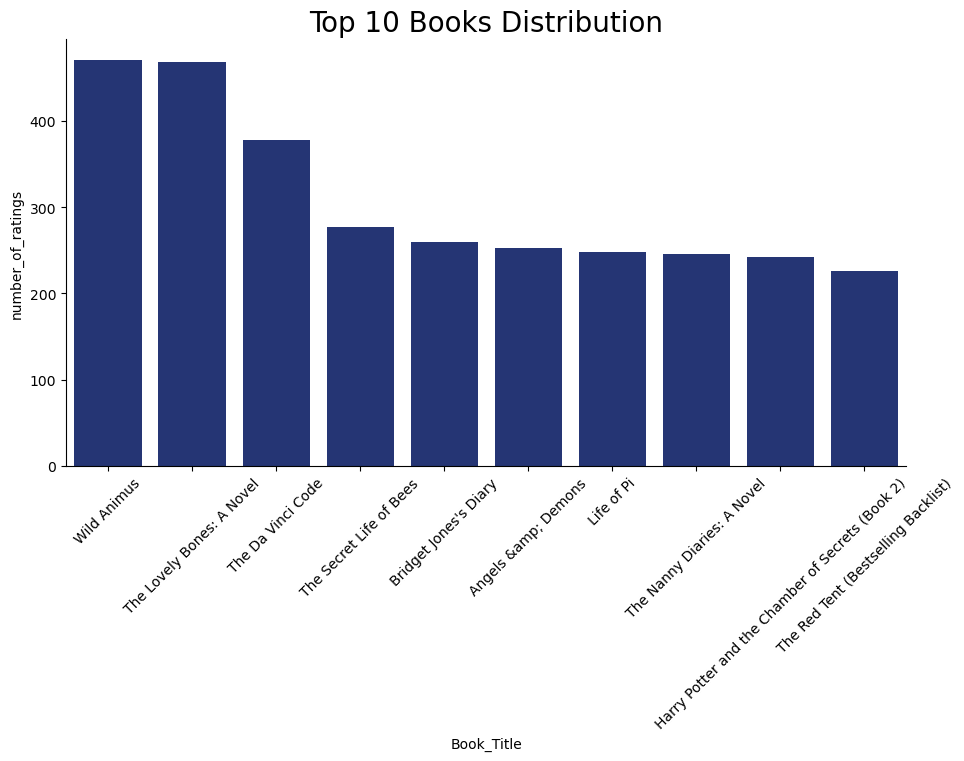

In [67]:
sns.catplot(x="Book_Title", y="number_of_ratings", data=df_top10_books, aspect=2, kind="bar", color='#182d81');
plt.title("Top 10 Books Distribution", fontsize=20);
plt.xticks(rotation=45);

In [68]:
# Aggregate by author
agg_author = df_books2.groupby('Book_Author').agg(mean_rating = ('Book_Rating', 'mean'),
                                                number_of_ratings = ('Book_Rating', 'count')).reset_index()
agg_author = agg_author[agg_author['number_of_ratings']>=250]

In [69]:
df_top10_author = agg_author.nlargest(10, 'number_of_ratings')[['Book_Author','number_of_ratings']]
df_top10_author = df_top10_author.set_index([pd.Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])])
df_top10_author.style.set_properties(**{'border': '1.3px solid black',
                          'color': 'black'}).background_gradient(cmap='Blues')

,Book_Author,number_of_ratings
1,Stephen King,3468
2,Nora Roberts,2125
3,John Grisham,1664
4,James Patterson,1547
5,J. K. Rowling,1351
6,Dean R. Koontz,1044
7,Mary Higgins Clark,1044
8,Janet Evanovich,989
9,Anne Rice,976
10,Dan Brown,876


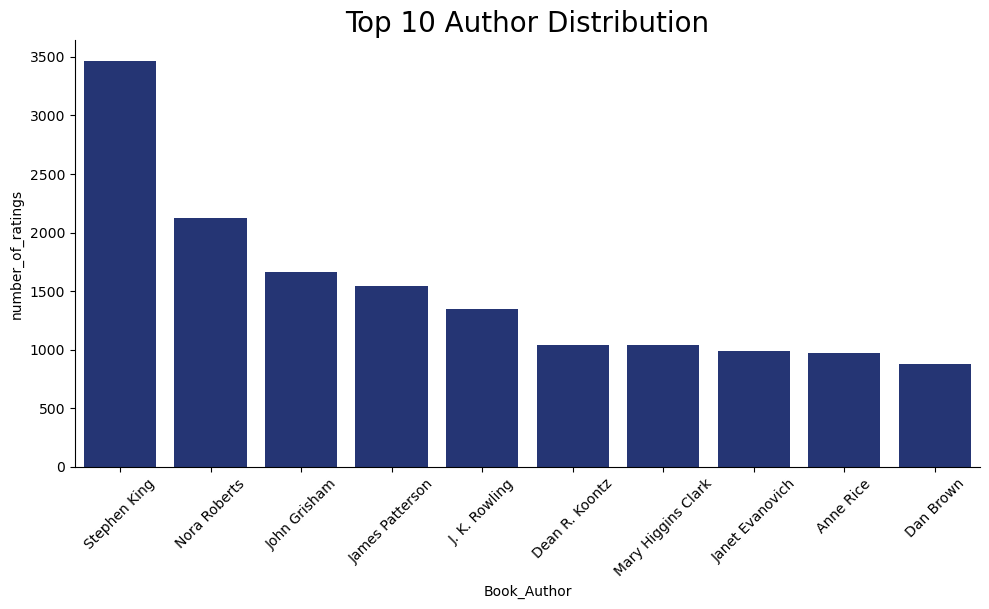

In [70]:
sns.catplot(x="Book_Author", y="number_of_ratings", data=df_top10_author, aspect=2, kind="bar", color='#182d81');
plt.title("Top 10 Author Distribution", fontsize=20);
plt.xticks(rotation=45);

In [71]:
df_top10_author_rating = agg_author.nlargest(10, 'mean_rating')[['Book_Author','mean_rating']]
df_top10_author_rating = df_top10_author_rating.set_index([pd.Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])])
df_top10_author_rating.style.set_properties(**{'border': '1.3px solid black',
                          'color': 'black'}).background_gradient(cmap='Blues')

,Book_Author,mean_rating
1,J.R.R. TOLKIEN,9.084932
2,J. K. Rowling,9.054034
3,J. R. R. Tolkien,8.881671
4,C. S. Lewis,8.533835
5,Sue Monk Kidd,8.465950
6,George Orwell,8.458621
7,Douglas Adams,8.417154
8,Roald Dahl,8.347945
9,William Shakespeare,8.335404
10,Neil Gaiman,8.325083


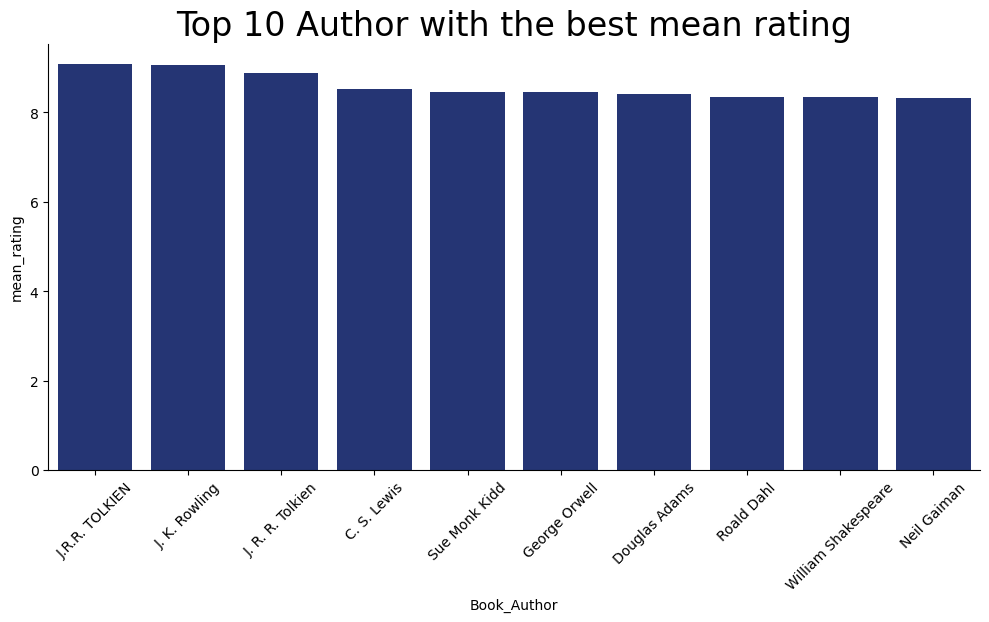

In [72]:
sns.catplot(x="Book_Author", y="mean_rating", data=df_top10_author_rating, aspect=2, kind="bar", color='#182d81');
plt.title("Top 10 Author with the best mean rating", fontsize=24);
plt.xticks(rotation=45);

In [73]:
agg_age_range = df_books2.groupby('age_range').agg(mean_rating = ('Book_Rating', 'mean'),
                                                number_of_ratings = ('Book_Rating', 'count')).reset_index()

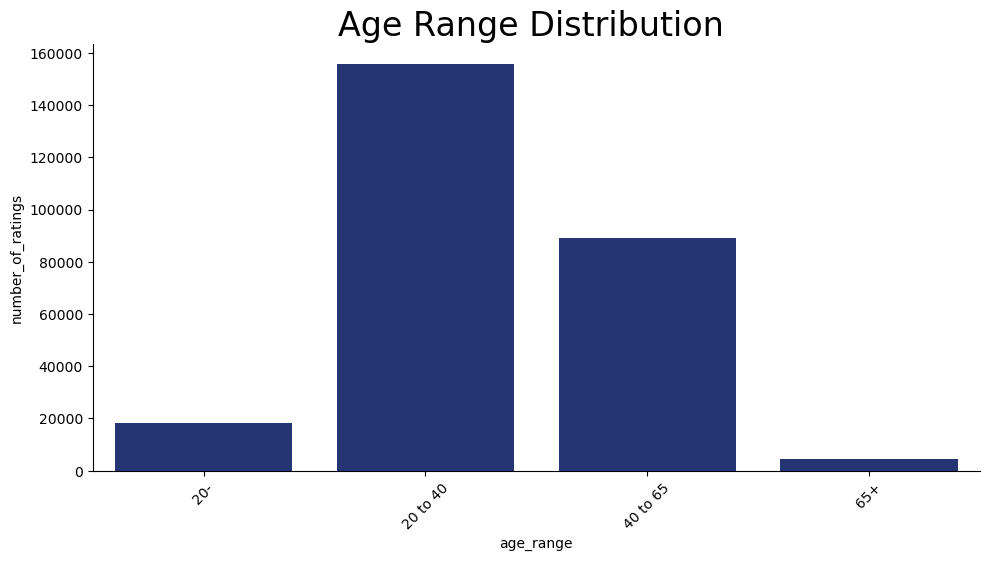

In [74]:
sns.catplot(x="age_range", y="number_of_ratings", data=agg_age_range, aspect=2, kind="bar", color='#182d81');
plt.title("Age Range Distribution ", fontsize=24);
plt.xticks(rotation=45);

## Recommendation System

Recommendation systems are characterized as a method for users to make decisions in complex informational settings. Additionally, the recommendation system was described in terms of e-commerce serves as a tool to assist consumers in searching through knowledge records that are relevant to their interests and preferences. When a person lacks adequate personal knowledge or expertise with the options, a recommendation system was defined as a way of supporting and enhancing the social process of leveraging suggestions from others to make decisions. User information overload is a common problem that recommendation systems address by offering individualized, unique content and service recommendations (Isinkaye, Folajimi and   Ojokoh, 2015).

### Popularity Based Recommendation

Popularity Based Recommendation is a kind of recommendation system that bases choices on factors like popularity and/or current trends. These algorithms look up the products or movies that are most in demand or well-liked by users and then immediately suggest those. 

In this analysis the most 5 popular books are Harry Potter and the Goblet of Fire (Book 4), Harry Potter and the Order of the Phoenix (Book 5}, The Return of the King (The Lord of the Rings, Part 3), Harry Potter and the Prisoner of Azkaban (Book 3), Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback)).

The Figure 6 shows the cover and the mean rating of the most 5 popular books.

How can observe the most popular books is not the same of the books with the highest number of evaluations (Figure 3), because in this system recommendation is conders the numbers of rated books and the mean rating. 


In [75]:
def popular_books(df):
    C= df['mean_rating'].mean()
    m= df['number_of_ratings'].quantile(0.90)
    
    Top_Books = df.loc[df['number_of_ratings'] >= m]

    def weighted_rating(x, m=m, C=C):
        v = x['number_of_ratings']
        R = x['mean_rating']
        return (v/(v+m) * R) + (m/(m+v) * C)
    
    Top_Books['Score'] = Top_Books.apply(weighted_rating,axis=1)
 
    #Sorting books based on score calculated above
    Top_Books = Top_Books.sort_values('Score', ascending=False)
    Top_Books=Top_Books.sort_values('Score', ascending=False).drop_duplicates('ISBN').sort_index()
    cm=sns.light_palette('blue',as_cmap=True)
    #Sorting books based on score calculated above
    Top_Books = Top_Books.sort_values('Score', ascending=False)

    #Printing the top 10 books
    return Top_Books[['Book_Title', 'number_of_ratings', 'mean_rating', 'Score']].reset_index(drop=True)

Text(0.5, 0.98, 'MOST POPULAR 5 BOOKS')

(-0.5, 344.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 9.2 ')

1: Harry Potter and the Goblet of Fire (Book 4):


(-0.5, 343.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 9.1 ')

2: Harry Potter and the Order of the Phoenix (Book 5):


(-0.5, 304.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 9.4 ')

3: The Return of the King (The Lord of the Rings, Part 3):


(-0.5, 342.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 9.2 ')

4: Harry Potter and the Prisoner of Azkaban (Book 3):


(-0.5, 347.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 9.0 ')

5: Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback)):


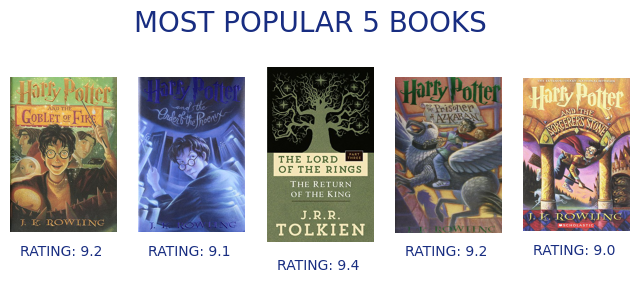

In [76]:
top_five=pd.DataFrame(popular_books(df_books2)).head(5)
fig,ax=plt.subplots(1,5,figsize=(8,3))
fig.suptitle("MOST POPULAR 5 BOOKS",fontsize=20,color="#182d81")
book_top=[]
for i in range(len(top_five["Book_Title"].tolist())):
    book_name=df_books2.loc[df_books2["Book_Title"]==top_five["Book_Title"].tolist()[i],"Book_Title"][:1].values[0]
    book_top.append(book_name)
    url=df_books2.loc[df_books2["Book_Title"]==top_five["Book_Title"].tolist()[i],"Image_URL_L"][:1].values[0]
    headers = {'User-Agent' : 
                           'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.5304.107 Safari/537.36'}
    img=Image.open(requests.get(url,stream=True, headers=headers).raw)
    ax[i].imshow(img);
    ax[i].axis("off");
    ax[i].set_title("RATING: {} ".format(round(df_books2[df_books2["Book_Title"]==top_five["Book_Title"].tolist()[i]]["Book_Rating"].mean(),1)),y=-0.20,color="#182d81",fontsize=10);
    fig.show();
    print('{0}: {1}:'.format(i+1, book_name));

In [77]:
def popular_author(df):
    C= df['mean_rating'].mean()
    m= df['number_of_ratings'].quantile(0.90)

    Top_author = df.loc[df['number_of_ratings'] >= m]

    def weighted_rating(x, m=m, C=C):
        v = x['number_of_ratings']
        R = x['mean_rating']
        return (v/(v+m) * R) + (m/(m+v) * C)
    
    Top_author['Score'] = Top_author.apply(weighted_rating,axis=1)
 
    #Sorting books based on score calculated above
    Top_author = Top_author.sort_values('Score', ascending=False)

    cm=sns.light_palette('blue',as_cmap=True)
    #Sorting books based on score calculated above
    Top_author = Top_author.sort_values('Score', ascending=False)

   
    return Top_author[['Book_Author', 'number_of_ratings', 'mean_rating', 'Score']].reset_index(drop=True)

In [78]:
top10_author=pd.DataFrame(popular_author(agg_author)).head(10)

In [79]:
cm=sns.light_palette('#182d81',as_cmap=True)
top10_author.reset_index(drop=True).head(10).style.background_gradient(cmap=cm)

,Book_Author,number_of_ratings,mean_rating,Score
0,J. K. Rowling,1351,9.054034,8.614540
1,Dan Brown,876,8.122146,7.993948
2,Stephen King,3468,8.018743,7.987747
3,Janet Evanovich,989,8.088979,7.983569
4,James Patterson,1547,7.835165,7.839850
5,Dean R. Koontz,1044,7.707854,7.768108
6,Nora Roberts,2125,7.720941,7.755241
7,John Grisham,1664,7.662861,7.722110
8,Michael Crichton,792,7.546717,7.696392
9,Mary Higgins Clark,1044,7.545019,7.674691


## Based Collaborative Filtering Recommender

In the collaborative based filtering recommendation, the focus is on the relationship between all users and items. In this case, the similarity between one item and another is defined based on the users' opinion. This is like they share product information and collaborate with each other.

The essence of collaborative filtering is this: two users who liked the same item at some point will potentially like another similar item in the future.

This filtering is used on occasions when little information is available about a specific buyer. As such, algorithms collect data, such as reviews and past purchases, and match that information with other users who have similar preferences. 


### Item-Based Collaborative Filtering

In the item-item is assigning a weight to all items in terms of similarity with the active item, it will select the items that have the most similarity with and calculate a prediction from the combination of the selected item ratings.

In this model was used the Nearest Neighbors model to predict the similarity into items. Then can recommend books with similarity with the specific book.

In [80]:
user_ratings_threshold = 3

filter_users = df_books2['User_ID'].value_counts()
filter_users_list = filter_users[filter_users >= user_ratings_threshold].index.to_list()

df_ratings_top = df_books2[df_books2['User_ID'].isin(filter_users_list)]

print('Filter: users with at least %d ratings\nNumber of records: %d' % (user_ratings_threshold, len(df_ratings_top)))

Filter: users with at least 3 ratings
Number of records: 235339


In [81]:
book_ratings_threshold_perc = 0.1
book_ratings_threshold = len(df_ratings_top['ISBN'].unique()) * book_ratings_threshold_perc

filter_books_list = df_ratings_top['ISBN'].value_counts().head(int(book_ratings_threshold)).index.to_list()
df_ratings_top = df_ratings_top[df_ratings_top['ISBN'].isin(filter_books_list)]

print('Filter: top %d%% most frequently rated books\nNumber of records: %d' % (book_ratings_threshold_perc*100, len(df_ratings_top)))

Filter: top 10% most frequently rated books
Number of records: 107942


In [82]:
df=df_ratings_top.copy()
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(df[['User_ID', 'ISBN', 'Book_Rating']], reader)

In [83]:
model_svd = SVD()
cv_results_svd = cross_validate(model_svd, data, cv=3)
pd.DataFrame(cv_results_svd).mean()     

test_rmse    1.574897
test_mae     1.214038
fit_time     1.011233
test_time    0.212566
dtype: float64

In [84]:
model_nmf = NMF()
cv_results_nmf = cross_validate(model_nmf, data, cv=3)
pd.DataFrame(cv_results_nmf).mean()

test_rmse    2.675515
test_mae     2.302127
fit_time     2.898828
test_time    0.357279
dtype: float64

In [85]:
param_grid = {'n_factors': [80,100],
              'n_epochs': [5, 20],
              'lr_all': [0.002, 0.005],
              'reg_all': [0.2, 0.4]}

gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
gs.fit(data)

print(gs.best_score['rmse'])
print(gs.best_params['rmse'])

1.571471228636737
{'n_factors': 80, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.2}


In [86]:
#split the data into train and test
trainset, testset = train_test_split(data, test_size=0.2)

model = SVD(n_factors=80, n_epochs=20, lr_all=0.005, reg_all=0.2)
model.fit(trainset)
predictions = model.test(testset)

In [87]:
#predict the rating
df_pred = pd.DataFrame(predictions, columns=['User_ID', 'ISBN', 'actual_rating', 'pred_rating', 'details'])
df_pred['impossible'] = df_pred['details'].apply(lambda x: x['was_impossible'])
df_pred['pred_rating_round'] = df_pred['pred_rating'].round()
df_pred['abs_err'] = abs(df_pred['pred_rating'] - df_pred['actual_rating'])
df_pred.drop(['details'], axis=1, inplace=True)
df_pred.sample(5)
     

,User_ID,ISBN,actual_rating,pred_rating,impossible,pred_rating_round,abs_err
16987,30210,080410526X,9.0,7.904317,False,8.0,1.095683
18012,126860,0345335058,7.0,7.689822,False,8.0,0.689822
19982,94787,0449219410,10.0,8.594044,False,9.0,1.405956
4239,115435,0553573314,9.0,9.177584,False,9.0,0.177584
18220,63956,0743225406,10.0,8.113694,False,8.0,1.886306


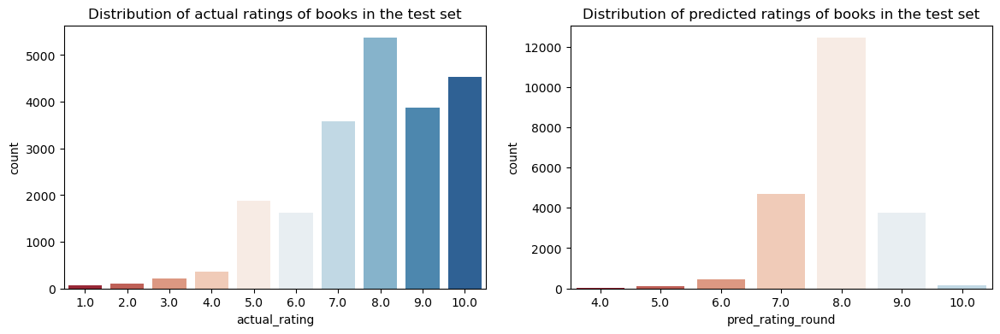

In [88]:
palette = sns.color_palette("RdBu", 10)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 4))

sns.countplot(x='actual_rating', data=df_pred, palette=palette, ax=ax1)
ax1.set_title('Distribution of actual ratings of books in the test set')

sns.countplot(x='pred_rating_round', data=df_pred, palette=palette, ax=ax2)
ax2.set_title('Distribution of predicted ratings of books in the test set')

plt.show();

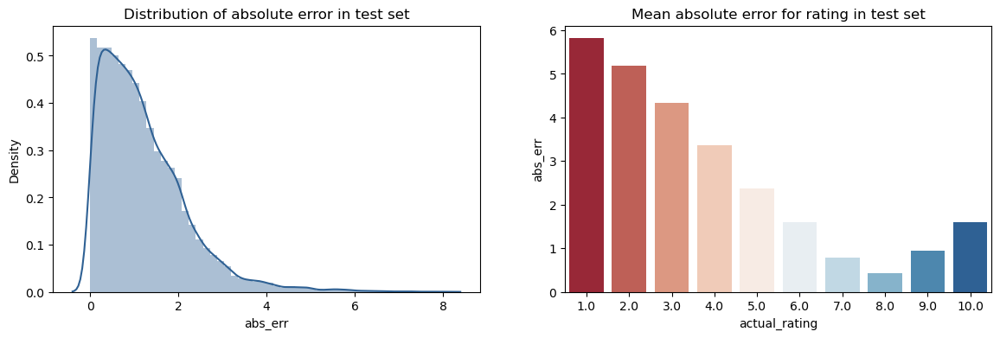

In [89]:
df_pred_err = df_pred.groupby('actual_rating')['abs_err'].mean().reset_index()

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 4))

sns.distplot(df_pred['abs_err'], color='#2f6194', ax=ax1)
ax1.set_title('Distribution of absolute error in test set')

sns.barplot(x='actual_rating', y='abs_err', data=df_pred_err, palette=palette, ax=ax2)
ax2.set_title('Mean absolute error for rating in test set')

plt.show();

In [90]:
df_ratings_top.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107942 entries, 5 to 262528
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   ISBN               107942 non-null  object  
 1   Book_Title         107942 non-null  object  
 2   Book_Author        107942 non-null  object  
 3   Year_Publication   107942 non-null  int64   
 4   Publisher          107942 non-null  object  
 5   Image_URL_S        107942 non-null  object  
 6   Image_URL_M        107942 non-null  object  
 7   Image_URL_L        107942 non-null  object  
 8   User_ID            107942 non-null  int64   
 9   Book_Rating        107942 non-null  int64   
 10  Age                107942 non-null  float64 
 11  age_range          107942 non-null  category
 12  loc                107942 non-null  object  
 13  country            107942 non-null  object  
 14  location           107942 non-null  object  
 15  Lat                107942 non-null

In [91]:
#Generating ratings matrix from explicit ratings table
ratings_matrix = df_ratings_top.pivot(index='User_ID', columns='ISBN', values='Book_Rating')
userID = ratings_matrix.index
ISBN = ratings_matrix.columns
print(ratings_matrix.shape)
ratings_matrix.head()
#Notice that most of the values are NaN (undefined) implying absence of ratings
     

(12334, 10999)


ISBN,0002251760,0002550563,0003300277,000617616X,000648302X,0006485200,000649840X,0006547834,0006550576,0006550789,...,9074336329,9500723832,950491036X,9505156642,9505156944,9580464162,958704049X,9722016563,9726101794,9871138148
User_ID,,,,,,,,,,,,,,,,,,,,,
92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
114,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
165,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
n_users = ratings_matrix.shape[0] #considering only those users who gave explicit ratings
n_books = ratings_matrix.shape[1]
print (n_users, n_books)

12334 10999


In [93]:
ratings_matrix.fillna(0, inplace = True)
ratings_matrix = ratings_matrix.astype(np.int32)


In [94]:
#checking first few rows
ratings_matrix.head(5)

ISBN,0002251760,0002550563,0003300277,000617616X,000648302X,0006485200,000649840X,0006547834,0006550576,0006550789,...,9074336329,9500723832,950491036X,9505156642,9505156944,9580464162,958704049X,9722016563,9726101794,9871138148
User_ID,,,,,,,,,,,,,,,,,,,,,
92,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
99,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
114,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
165,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
232,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [95]:
#calculating the sparsity
sparsity = 1.0-len(df_books2)/float(df_books2.shape[0]*n_books)
print ('The sparsity level of Book Crossing dataset is ' +  str(sparsity*100) + ' %')

The sparsity level of Book Crossing dataset is 99.99090826438767 %


In [96]:
combine_book_rating = df_books2.copy()

In [97]:
combine_book_rating = combine_book_rating[['User_ID','ISBN', 'Book_Rating', 'Book_Title', 'Image_URL_L']]
combine_book_rating.head()

,User_ID,ISBN,Book_Rating,Book_Title,Image_URL_L
0,67544,0002005018,8,Clara Callan,http://images.amazon.com/images/P/0002005018.0...
1,219008,0002005018,7,Clara Callan,http://images.amazon.com/images/P/0002005018.0...
2,263325,0002005018,6,Clara Callan,http://images.amazon.com/images/P/0002005018.0...
3,2954,0060973129,8,Decision in Normandy,http://images.amazon.com/images/P/0060973129.0...
4,152827,0060973129,7,Decision in Normandy,http://images.amazon.com/images/P/0060973129.0...


In [98]:
# Creating a feature that count the amount of each book
book_ratingcount = (combine_book_rating.
                    groupby(by = ['Book_Title',])['Book_Rating'].
                    count().
                    reset_index().
                    rename(columns = {'Book_Rating':'TotalRatingCount'})
                    [['Book_Title','TotalRatingCount']])
     

In [99]:
book_ratingcount.head()

,Book_Title,TotalRatingCount
0,"Ask Lily (Young Women of Faith: Lily Series, ...",1
1,Dark Justice,1
2,Earth Prayers From around the World: 365 Pray...,3
3,Final Fantasy Anthology: Official Strategy Gu...,2
4,Flight of Fancy: American Heiresses (Zebra Ba...,1


In [100]:
#include the amount of book information in the dataset
rating_with_totalratingcount = pd.merge(combine_book_rating, book_ratingcount, on = 'Book_Title', how = 'inner' )

In [101]:
rating_with_totalratingcount.head()

,User_ID,ISBN,Book_Rating,Book_Title,Image_URL_L,TotalRatingCount
0,67544,0002005018,8,Clara Callan,http://images.amazon.com/images/P/0002005018.0...,3
1,219008,0002005018,7,Clara Callan,http://images.amazon.com/images/P/0002005018.0...,3
2,263325,0002005018,6,Clara Callan,http://images.amazon.com/images/P/0002005018.0...,3
3,2954,0060973129,8,Decision in Normandy,http://images.amazon.com/images/P/0060973129.0...,2
4,152827,0060973129,7,Decision in Normandy,http://images.amazon.com/images/P/0060973129.0...,2


In [102]:
#Descritive analysis
pd.set_option('display.float_format', lambda x: '%.3f' % x)
print(book_ratingcount['TotalRatingCount'].describe())     

count   108305.000
mean         2.467
std          6.889
min          1.000
25%          1.000
50%          1.000
75%          2.000
max        471.000
Name: TotalRatingCount, dtype: float64


In [103]:
print(book_ratingcount['TotalRatingCount'].quantile(np.arange(.9,1,.01)))

0.900    4.000
0.910    4.000
0.920    5.000
0.930    5.000
0.940    6.000
0.950    7.000
0.960    8.000
0.970   11.000
0.980   14.000
0.990   23.000
Name: TotalRatingCount, dtype: float64


In [104]:
# Filtering the books that have 50 ratings or more
popularity_threshold = 50
rating_popular_book = rating_with_totalratingcount.query('TotalRatingCount >= @popularity_threshold')

In [105]:
rating_popular_book.head()

,User_ID,ISBN,Book_Rating,Book_Title,Image_URL_L,TotalRatingCount
10,29526,0399135782,9,The Kitchen God's Wife,http://images.amazon.com/images/P/0399135782.0...,77
11,46398,0399135782,9,The Kitchen God's Wife,http://images.amazon.com/images/P/0399135782.0...,77
12,67958,0399135782,10,The Kitchen God's Wife,http://images.amazon.com/images/P/0399135782.0...,77
13,115097,0399135782,7,The Kitchen God's Wife,http://images.amazon.com/images/P/0399135782.0...,77
14,230522,0399135782,7,The Kitchen God's Wife,http://images.amazon.com/images/P/0399135782.0...,77


In [106]:
# Analysing the rows dropped
if not rating_popular_book[rating_popular_book.duplicated(['User_ID', 'Book_Title'])].empty:
    initial_rows = rating_popular_book.shape[0]

    print('Initial dataframe shape {0}'.format(rating_popular_book.shape))
    rating_popular_book = rating_popular_book.drop_duplicates(['User_ID', 'Book_Title'])
    current_rows = rating_popular_book.shape[0]
    print('New dataframe shape {0}'.format(rating_popular_book.shape))
    print('Removed {0} rows'.format(initial_rows - current_rows))

Initial dataframe shape (32241, 6)
New dataframe shape (32108, 6)
Removed 133 rows


In [107]:
# Creatinng matrix rating by book and user 
user_rating_pivot = rating_popular_book.pivot(index = 'Book_Title',columns = 'User_ID', values = 'Book_Rating').fillna(0)
user_rating_matrix = csr_matrix(user_rating_pivot.values)

In [108]:
#Fitting the model Nearest Neighbors
model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn.fit(user_rating_matrix)     

NearestNeighbors(algorithm='brute', metric='cosine')

In [109]:
user_rating_pivot

User_ID,42,51,99,114,125,165,183,185,242,254,...,278683,278723,278755,278798,278800,278832,278836,278843,278844,278846
Book_Title,,,,,,,,,,,,,,,,,,,,,
"""O"" Is for Outlaw",0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1984,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,9.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1st to Die: A Novel,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2nd Chance,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
A Bend in the Road,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wild Animus,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
Wish You Well,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
"Wizard and Glass (The Dark Tower, Book 4)",0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


Text(0.5, 0.98, 'YOU MAY ALSO LIKE THESE BOOKS')

Recommendations for Skipping Christmas:

1: Skipping Christmas:


(-0.5, 322.5, 474.5, -0.5)

Text(0.5, -0.2, 'RATING: 7.5 ')

2: The Wedding:


(-0.5, 339.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 8.2 ')

3: The Gift:


(-0.5, 304.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 7.7 ')

4: When the Wind Blows:


(-0.5, 313.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 7.6 ')

5: The Runaway Jury:


(-0.5, 303.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 7.8 ')

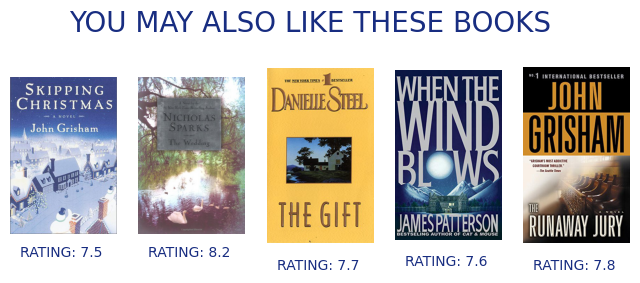

In [110]:
# Gerating the recommendation based in the item
query_index = np.random.choice(user_rating_pivot.shape[0])
distances, indices = model_knn.kneighbors(user_rating_pivot.iloc[query_index, :].values.reshape((1, -1)), n_neighbors = 5)

fig,ax=plt.subplots(1,5,figsize=(8,3))
fig.suptitle("YOU MAY ALSO LIKE THESE BOOKS",fontsize=20,color="#182d81")
print('Recommendations for {0}:\n'.format(user_rating_pivot.index[query_index]))
for i in range(0, len(distances.flatten())):

    print('{0}: {1}:'.format(i+1, user_rating_pivot.index[indices.flatten()[i]]))
        
    book_name=df_books2.loc[df_books2["Book_Title"]==user_rating_pivot.index[indices.flatten()[i]],"Book_Title"][:1].values[0]
    url=df_books2.loc[df_books2["Book_Title"]==user_rating_pivot.index[indices.flatten()[i]],"Image_URL_L"][:1].values[0]
    headers = {'User-Agent' : 
                       'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.5304.107 Safari/537.36'}
    img=Image.open(requests.get(url,stream=True, headers=headers).raw)
    ax[i].imshow(img)
    ax[i].axis("off")
    ax[i].set_title("RATING: {} ".format(round(df_books2[df_books2["Book_Title"]==user_rating_pivot.index[indices.flatten()[i]]]["Book_Rating"].mean(),1)),y=-0.20,color="#182d81",fontsize=10)
    fig.show()


### User Based Colaborative Filtering

In the user-user is assigning a weight to all users in terms of similarity with the active user, it will select the user that have the most similarity with and calculate a prediction from the combination of the selected user ratings.

In this model was used the cosine similarity to calculate the similarity into users, then predict recommendation of books.

In [111]:
 # Drop users who vote less than 100 times.
df_users_100=df_books2[df_books2['User_ID'].map(df_books2['User_ID'].value_counts()) > 100] 
users_pivot=df_users_100.pivot_table(index=["User_ID"],columns=["Book_Title"],values="Book_Rating")
users_pivot.fillna(0,inplace=True)

In [112]:
def users_choice(id):
    
    users_fav=df_users_100[df_users_100["User_ID"]==id].sort_values(["Book_Rating"],ascending=False)[0:5]
    return users_fav

In [113]:
def user_based(df_users_100,id):
    if id not in df_users_100["User_ID"].values:
        print("USER NOT FOUND")
        
        
    else:
        index=np.where(users_pivot.index==id)[0][0]
        similarity=cosine_similarity(users_pivot)
        similar_users=list(enumerate(similarity[index]))
        similar_users = sorted(similar_users,key = lambda x:x[1],reverse=True)[0:5]
    
        user_rec=[]
    
        for i in similar_users:
                data=df_books2[df_books2["User_ID"]==users_pivot.index[i[0]]]
                user_rec.extend(list(data.drop_duplicates("User_ID")["User_ID"].values))
        
    return user_rec

In [114]:
def common(df_users_100,user,user_id):
    x=df_users_100[df_users_100["User_ID"]==user_id]
    recommend_books=[]
    user=list(user)
    for i in user:
        y=df_users_100[(df_users_100["User_ID"]==i)]
        books=y.loc[~y["Book_Title"].isin(x["Book_Title"]),:]
        books=books.sort_values(["Book_Rating"],ascending=False)[0:5]
        recommend_books.extend(books["Book_Title"].values)
        
    return recommend_books[0:5]

Recommendations for User 245410:



Text(0.5, 0.98, 'YOUR FAVORITE BOOKS')

(-0.5, 323.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 10.0 ')

(-0.5, 322.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 8.0 ')

(-0.5, 328.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 8.0 ')

(-0.5, 308.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 7.9 ')

(-0.5, 323.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 9.0 ')

Text(0.5, 0.98, 'YOU MAY ALSO LIKE THESE BOOKS')

(-0.5, 311.5, 474.5, -0.5)

Text(0.5, -0.2, 'RATING: 10.0 ')

1: The Federalist : A Commentary on the Constitution of the United States (Modern Library Classics):


(-0.5, 336.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 8.6 ')

2: Lies My Teacher Told Me : Everything Your American History Textbook Got Wrong:


(-0.5, 342.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 9.2 ')

3: Island of the Blue Dolphins:


(-0.5, 316.5, 499.5, -0.5)

Text(0.5, -0.2, 'RATING: 7.7 ')

4: For Love of Evil : Book Six of Incarnations of Immortality (Incarnations of Immortality (Paperback)):


(-0.5, 311.5, 474.5, -0.5)

Text(0.5, -0.2, 'RATING: 10.0 ')

5: Lilith's Brood:


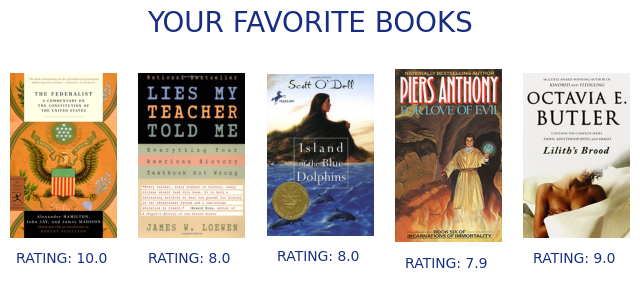

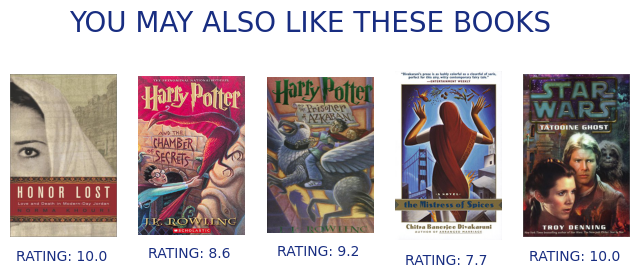

In [115]:
user_id=random.choice(df_users_100["User_ID"].values)
user_choice_df=pd.DataFrame(users_choice(user_id))
user_favorite=users_choice(user_id)
n=len(user_choice_df["Book_Title"].values)
print('Recommendations for User {0}:\n'.format(user_id))
    
fig,ax=plt.subplots(1,n,figsize=(8,3))
fig.suptitle("YOUR FAVORITE BOOKS",fontsize=20,color="#182d81")
    
for i in range(n):
        book_name = df_users_100.loc[df_users_100['Book_Title'] == user_choice_df['Book_Title'].tolist()[i],'Book_Title'][:1].values[0]
        url=df_users_100.loc[df_users_100["Book_Title"]==user_choice_df["Book_Title"].tolist()[i],"Image_URL_L"][:1].values[0]
        headers = {'User-Agent' : 
                    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.5304.107 Safari/537.36'}
        img=Image.open(requests.get(url,stream=True, headers=headers).raw)
        ax[i].imshow(img)
        ax[i].axis("off")
        ax[i].set_title("RATING: {} ".format(round(df_users_100[df_users_100["Book_Title"]==user_choice_df["Book_Title"].tolist()[i]]["Book_Rating"].mean(),1)),y=-0.20,color="#182d81",fontsize=10)
        fig.show()
        

user_based_rec=user_based(df_users_100,user_id)
books_for_user=common(df_users_100,user_based_rec,user_id)
books_for_userDF=pd.DataFrame(books_for_user,columns=["Book_Title"])

fig,ax=plt.subplots(1,5,figsize=(8,3))
fig.suptitle("YOU MAY ALSO LIKE THESE BOOKS",fontsize=20,color="#182d81")
for i in range(n):
    book_name = df_users_100.loc[df_users_100['Book_Title'] == user_choice_df['Book_Title'].tolist()[i],'Book_Title'][:1].values[0]
    url=df_users_100.loc[df_users_100["Book_Title"]==books_for_userDF["Book_Title"].tolist()[i],"Image_URL_L"][:1].values[0]
    headers = {'User-Agent' : 
                           'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.5304.107 Safari/537.36'}
    img=Image.open(requests.get(url,stream=True, headers=headers).raw)
    ax[i].imshow(img)
    ax[i].axis("off")
    ax[i].set_title("RATING: {} ".format(round(df_users_100[df_users_100["Book_Title"]==books_for_userDF["Book_Title"].tolist()[i]]["Book_Rating"].mean(),1)),y=-0.20,color="#182d81",fontsize=10)
    fig.show()
    print('{0}: {1}:'.format(i+1, book_name))

### Content-Based Collaborative Filtering

Content-based recommendation uses information about items to learn customer preferences and recommends items that share properties with items a customer has previously interacted with. 

In this analysis was considered the features Book Title, Author and Publisher. After modelling, to verify the book recommend it is used the book tittle.

In [116]:

def content_based(bookTitle):
    bookTitle=str(bookTitle)
    
    if bookTitle in df_books2["Book_Title"].values:
        rating_count=pd.DataFrame(df_books2["Book_Title"].value_counts())
        rare_books=rating_count[rating_count["Book_Title"]<=100].index
        common_books=df_books2[~df_books2["Book_Title"].isin(rare_books)]
        
        if bookTitle in rare_books:
            most_common=pd.Series(common_books["Book_Title"].unique()).sample(3).values
            print('There are no recommendations for {0}:'.format(bookTitle))
            print("YOU MAY TRY: \n ")
            print("{}".format(most_common[0]), "\n")
            print("{}".format(most_common[1]), "\n")
            print("{}".format(most_common[2]), "\n")
        else:
            print('Recommendations for {0}:\n'.format(bookTitle))
            common_books=common_books.drop_duplicates(subset=["Book_Title"])
            common_books.reset_index(inplace=True)
            common_books["index"]=[i for i in range(common_books.shape[0])]
            targets=["Book_Title","Book_Author","Publisher"]
            common_books["all_features"] = [" ".join(common_books[targets].iloc[i,].values) for i in range(common_books[targets].shape[0])]
            vectorizer=CountVectorizer()
            common_booksVector=vectorizer.fit_transform(common_books["all_features"])
            similarity=cosine_similarity(common_booksVector)
            index=common_books[common_books["Book_Title"]==bookTitle]["index"].values[0]
            similar_books=list(enumerate(similarity[index]))
            similar_booksSorted=sorted(similar_books,key=lambda x:x[1],reverse=True)[1:6]
            books=[]
            for i in range(len(similar_booksSorted)):
                
                books.append(common_books[common_books["index"]==similar_booksSorted[i][0]]["Book_Title"].item())

            fig,ax=plt.subplots(1,5,figsize=(8,3))
            fig.suptitle("YOU MAY ALSO LIKE THESE BOOKS",fontsize=20,color="#182d81")
                
            for i in range(len(books)):
                
                book_name =common_books.loc[common_books["Book_Title"]==books[i],"Book_Title"][:1].values[0]
                url=common_books.loc[common_books["Book_Title"]==books[i],"Image_URL_L"][:1].values[0]
                headers = {'User-Agent' : 
                            'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.5304.107 Safari/537.36'}
                img=Image.open(requests.get(url,stream=True, headers=headers).raw)
                ax[i].imshow(img)
                ax[i].axis("off")
                ax[i].set_title("RATING: {}".format(round(df_books2[df_books2["Book_Title"]==books[i]]["Book_Rating"].mean(),1)),y=-0.20,color="#182d81",fontsize=10)
                fig.show()
                print('{0}: {1}:'.format(i+1, book_name))

    else:
        print("CAN NOT FIND ")  
    return content_based

Recommendations for The Da Vinci Code:

1: The Catcher in the Rye:
2: The Brethren:
3: The Firm:
4: The Client:
5: The Chamber:


<function __main__.content_based(bookTitle)>

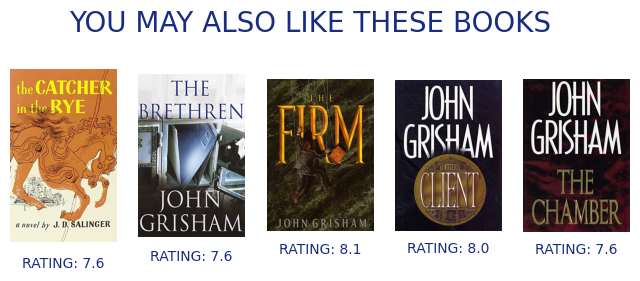

In [117]:
content_based('The Da Vinci Code')

## Market Basket

Market basket analysis is a field within the area of data mining that allows detecting associations between data. This technique is based on the theory that customers who buy a particular item or group of items are more likely to buy another specific item or group of items.

An important concept to understand how algorithms work is that of Measures of Association - Support, Confidence and Lift.

Support: measures the frequency that a combination between items occurs considering all purchases.

Confidence: represents the number of times the two items were purchased together, in relation to the times that item was purchased.

Lift: represents the association between the items. If Lift >= 1 there is attraction, while Lift < 1 there is retraction between the products.

The algorithms Apriori and FP Growth are the most use algorithms. 


In [118]:
#Reading the dataset
df_groceries = pd.read_csv('Groceries data.csv')

In [119]:
df_groceries.head()

,Member_number,Date,itemDescription,year,month,day,day_of_week
0,1808,2015-07-21,tropical fruit,2015,7,21,1
1,2552,2015-05-01,whole milk,2015,5,1,4
2,2300,2015-09-19,pip fruit,2015,9,19,5
3,1187,2015-12-12,other vegetables,2015,12,12,5
4,3037,2015-01-02,whole milk,2015,1,2,4


#### Data Preparation

In [120]:
# Remove any whote spaces or specified characters at the start and end of a string. 
df_groceries['itemDescription'] = df_groceries['itemDescription'].str.strip()

# astype is a Pandas function for DataFrames (and numpy for numpy arrays) that will cast the object to the specified type
df_groceries['Member_number'] = df_groceries['Member_number'].astype('str')

# astype is a Pandas function for DataFrames (and numpy for numpy arrays) that will cast the object to the specified type
df_groceries['day_of_week'] = df_groceries['day_of_week'].astype('str')

df_groceries['transaction'] = (df_groceries['Member_number']) + (df_groceries['day_of_week'])
df_groceries.head()

,Member_number,Date,itemDescription,year,month,day,day_of_week,transaction
0,1808,2015-07-21,tropical fruit,2015,7,21,1,18081
1,2552,2015-05-01,whole milk,2015,5,1,4,25524
2,2300,2015-09-19,pip fruit,2015,9,19,5,23005
3,1187,2015-12-12,other vegetables,2015,12,12,5,11875
4,3037,2015-01-02,whole milk,2015,1,2,4,30374


In [121]:
df_groceries['transaction'].value_counts()

30501    19
40785    16
48281    16
19432    16
25120    15
         ..
39044     2
35450     2
48041     2
30895     2
49936     2
Name: transaction, Length: 11542, dtype: int64

In [122]:
df_groceries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38765 entries, 0 to 38764
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Member_number    38765 non-null  object
 1   Date             38765 non-null  object
 2   itemDescription  38765 non-null  object
 3   year             38765 non-null  int64 
 4   month            38765 non-null  int64 
 5   day              38765 non-null  int64 
 6   day_of_week      38765 non-null  object
 7   transaction      38765 non-null  object
dtypes: int64(3), object(5)
memory usage: 2.4+ MB


In [123]:
# Print number of transactions.
print(len(df_groceries['transaction'].unique()))

11542


In [124]:
# Print number of items.
print(len(df_groceries['itemDescription'].unique()))

167


In [125]:
df_groceries["day_of_week"].unique()

array(['1', '4', '5', '2', '0', '3', '6'], dtype=object)

In [126]:
df_groceries["month"]= df_groceries["month"].replace((1,2,3,4,5,6,7,8,9,10,11,12),('01.January ','02.February','03.March','04.April' ,'05.May' ,'06.June'  ,'07.July' ,'08.August','09.September','10.October','11.November','12.December'))
df_groceries["day_of_week"] = df_groceries["day_of_week"].replace(('0','1','2','3','4','5','6'),('Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'))
df_groceries

,Member_number,Date,itemDescription,year,month,day,day_of_week,transaction
0,1808,2015-07-21,tropical fruit,2015,07.July,21,Tuesday,18081
1,2552,2015-05-01,whole milk,2015,05.May,1,Friday,25524
2,2300,2015-09-19,pip fruit,2015,09.September,19,Saturday,23005
3,1187,2015-12-12,other vegetables,2015,12.December,12,Saturday,11875
4,3037,2015-01-02,whole milk,2015,01.January,2,Friday,30374
...,...,...,...,...,...,...,...,...
38760,4471,2014-08-10,sliced cheese,2014,08.August,10,Sunday,44716
38761,2022,2014-02-23,candy,2014,02.February,23,Sunday,20226
38762,1097,2014-04-16,cake bar,2014,04.April,16,Wednesday,10972
38763,1510,2014-03-12,fruit/vegetable juice,2014,03.March,12,Wednesday,15102


#### Exploratory Data Analysis

In [127]:
Top_10_purchased_product = df_groceries["itemDescription"].value_counts().reset_index(name='Quantity').head(10)
Top_10_purchased_product

,index,Quantity
0,whole milk,2502
1,other vegetables,1898
2,rolls/buns,1716
3,soda,1514
4,yogurt,1334
5,root vegetables,1071
6,tropical fruit,1032
7,bottled water,933
8,sausage,924
9,citrus fruit,812


<Figure size 2000x1000 with 0 Axes>

[Text(0, 0, '2502'),
 Text(0, 0, '1898'),
 Text(0, 0, '1716'),
 Text(0, 0, '1514'),
 Text(0, 0, '1334'),
 Text(0, 0, '1071'),
 Text(0, 0, '1032'),
 Text(0, 0, '933'),
 Text(0, 0, '924'),
 Text(0, 0, '812')]

Text(0.5, 1.0, 'Top 10 Purchased Product')

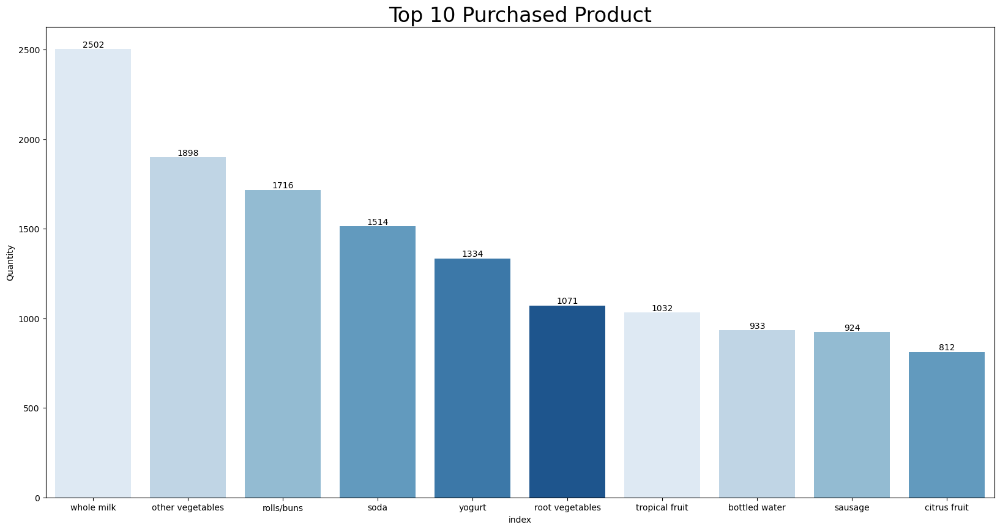

In [128]:
plt.figure(figsize=(20,10))
colors=sns.color_palette('Blues')
ax=sns.barplot(x="index",y="Quantity",data=Top_10_purchased_product,palette=colors)
for i in ax.containers:
    ax.bar_label(i)
plt.title("Top 10 Purchased Product", fontsize=24)
plt.show()

In [129]:
Top_10_purchased_product = Top_10_purchased_product.set_index('index')

<Figure size 1000x1000 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Tree Map of Top 10 Items')

(0.0, 100.0, 0.0, 100.0)

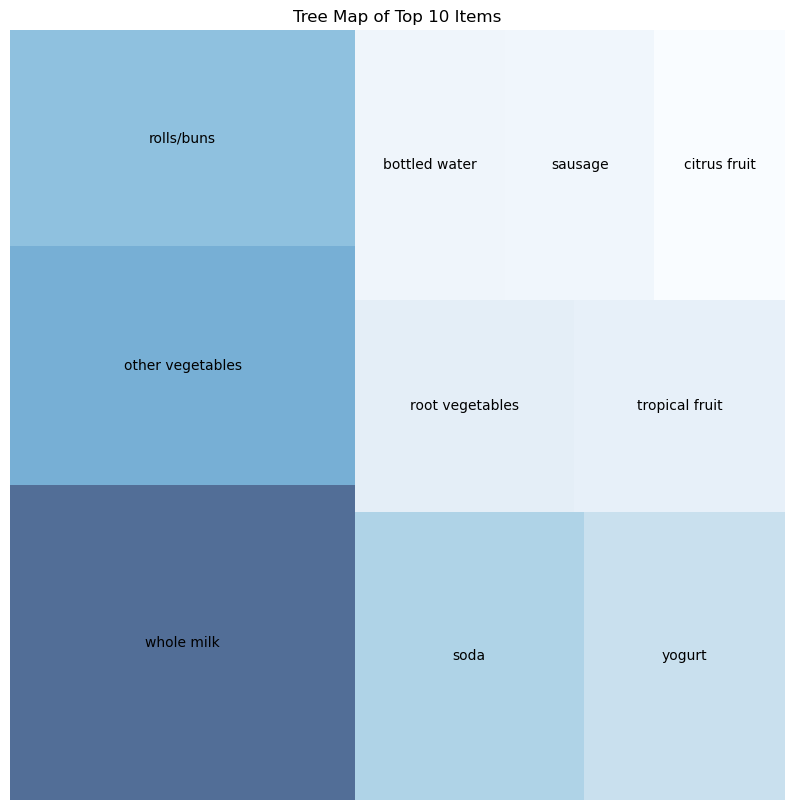

In [130]:
# create a color palette, mapped to these values
my_values=Top_10_purchased_product.Quantity
cmap = matplotlib.cm.Blues
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]


#treemap of top 20 frequent items
plt.figure(figsize=(10,10))
squarify.plot(sizes=Top_10_purchased_product.Quantity, label=Top_10_purchased_product.index, alpha=.7,color=colors)
plt.title("Tree Map of Top 10 Items")
plt.axis('off')

In [131]:
#Total product sales by Month

datamonth=df_groceries.groupby(['month', 'year'])['itemDescription'].count().reset_index()
datamonth.rename(columns={"itemDescription":"Quantity"},inplace = True)
datamonth


,month,year,Quantity
0,01.January,2014,1504
1,01.January,2015,1829
2,02.February,2014,1547
3,02.February,2015,1485
4,03.March,2014,1491
5,03.March,2015,1792
6,04.April,2014,1506
7,04.April,2015,1666
8,05.May,2014,1625
9,05.May,2015,1710


C:\Users\vankr\anaconda3\lib\site-packages\seaborn\categorical.py:381: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < "3.0":
C:\Users\vankr\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


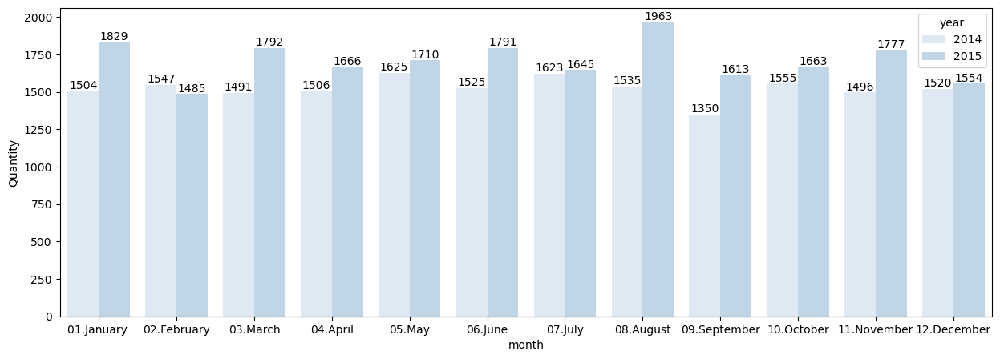

In [132]:
plt.figure(figsize=(15,5))
colors=sns.color_palette("Blues")
ax=sns.barplot(x="month",y="Quantity", hue='year',data=datamonth,palette=colors)
for i in ax.containers:
     ax.bar_label(i)
plt.show();


In [133]:
products = df_groceries["itemDescription"].unique()

In [134]:
one_hot = pd.get_dummies(df_groceries["itemDescription"])

df_groceries2=df_groceries.drop(['itemDescription'], axis=1)
df_groceries2 = df_groceries2.join(one_hot)

df_groceries2.head()

,Member_number,Date,year,month,day,day_of_week,transaction,Instant food products,UHT-milk,abrasive cleaner,...,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
0,1808,2015-07-21,2015,07.July,21,Tuesday,18081,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2552,2015-05-01,2015,05.May,1,Friday,25524,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,2300,2015-09-19,2015,09.September,19,Saturday,23005,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1187,2015-12-12,2015,12.December,12,Saturday,11875,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,3037,2015-01-02,2015,01.January,2,Friday,30374,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [135]:
records = df_groceries2.groupby(["Member_number","Date"])[products[:]].sum()
records = records.reset_index()[products]

records

,tropical fruit,whole milk,pip fruit,other vegetables,rolls/buns,pot plants,citrus fruit,beef,frankfurter,chicken,...,flower (seeds),rice,tea,salad dressing,specialty vegetables,pudding powder,ready soups,make up remover,toilet cleaner,preservation products
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14958,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14959,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14960,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14961,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [136]:
def get_product_names(x):
    for product in products:
        if x[product] != 0:
            x[product] = product
    return x

records = records.apply(get_product_names, axis=1)
records.head()

print(f"Total transactions: {len(records)}")

,tropical fruit,whole milk,pip fruit,other vegetables,rolls/buns,pot plants,citrus fruit,beef,frankfurter,chicken,...,flower (seeds),rice,tea,salad dressing,specialty vegetables,pudding powder,ready soups,make up remover,toilet cleaner,preservation products
0,0,whole milk,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,whole milk,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Total transactions: 14963


In [137]:
# Removing zeros in DataFrame
x = records.values
x = [sub[~(sub == 0)].tolist() for sub in x if sub[sub != 0].tolist()]
transactions = x

In [138]:
transactions

[['whole milk', 'pastry', 'salty snack'],
 ['whole milk', 'yogurt', 'sausage', 'semi-finished bread'],
 ['soda', 'pickled vegetables'],
 ['canned beer', 'misc. beverages'],
 ['sausage', 'hygiene articles'],
 ['whole milk', 'rolls/buns', 'sausage'],
 ['whole milk', 'soda'],
 ['frankfurter', 'soda', 'whipped/sour cream'],
 ['frankfurter', 'curd'],
 ['beef', 'white bread'],
 ['whole milk', 'butter'],
 ['other vegetables', 'frozen vegetables'],
 ['tropical fruit', 'sugar'],
 ['butter milk', 'specialty chocolate'],
 ['frozen meals', 'dental care'],
 ['rolls/buns'],
 ['root vegetables', 'detergent'],
 ['rolls/buns', 'sausage'],
 ['dish cleaner', 'cling film/bags'],
 ['canned beer', 'frozen fish'],
 ['tropical fruit', 'whole milk', 'pip fruit'],
 ['whole milk', 'root vegetables', 'pastry'],
 ['rolls/buns', 'chocolate', 'red/blush wine'],
 ['other vegetables', 'shopping bags'],
 ['whole milk', 'rolls/buns', 'packaged fruit/vegetables', 'chocolate'],
 ['other vegetables', 'hygiene articles'],
 

In [139]:
df_groceries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38765 entries, 0 to 38764
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Member_number    38765 non-null  object
 1   Date             38765 non-null  object
 2   itemDescription  38765 non-null  object
 3   year             38765 non-null  int64 
 4   month            38765 non-null  object
 5   day              38765 non-null  int64 
 6   day_of_week      38765 non-null  object
 7   transaction      38765 non-null  object
dtypes: int64(2), object(6)
memory usage: 2.4+ MB


In [140]:
basket = (df_groceries
          .groupby(['transaction', 'itemDescription'])['itemDescription']
          .count().unstack().reset_index().fillna(0)
          .set_index('transaction'))

basket

itemDescription,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,bags,baking powder,bathroom cleaner,beef,berries,...,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
transaction,,,,,,,,,,,,,,,,,,,,,
10001,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000
10002,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
10004,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
10006,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000
10011,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,...,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49993,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
49995,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,...,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000
50002,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [141]:
# Create and declare a method named as 'encode_units()'
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

basket_sets = basket.applymap(encode_units)

basket_sets

itemDescription,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,bags,baking powder,bathroom cleaner,beef,berries,...,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
transaction,,,,,,,,,,,,,,,,,,,,,
10001,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10006,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
10011,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49993,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49995,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0
50002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Apriori Algorithm

The Apriori algorithm is intended to operate in the database that contains transactional details. This approach use an iterative level-wise search process to find (n + 1) itemsets from n items.

In this study was considered a minimum support equal 0.01 given that the highest value was 0.19. The minimum lift was 1, because want to consider that there is attraction between the products. 

The Figure 9 shows the rules results. Then we can analyse that who purchase domestic eggs also purchase whole milk with 23% of confidence. Who purchase newspapers purchase also whole milk with 21% of confidence.

In the Figure 9 we can observe the network graph. In the graph we can see that the whole milk is the product that have more attraction with the other products.


In [142]:
#Generate the frequent itemsets
frequent_itemsets = apriori(basket_sets, min_support=0.01, use_colnames=True).sort_values("support",ascending=False)
frequent_itemsets.head(10)

C:\Users\vankr\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:111: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
71,0.196,(whole milk)
44,0.153,(other vegetables)
54,0.139,(rolls/buns)
61,0.123,(soda)
72,0.109,(yogurt)
55,0.089,(root vegetables)
66,0.086,(tropical fruit)
6,0.078,(bottled water)
57,0.077,(sausage)
16,0.068,(citrus fruit)


In [143]:
#Apply association rules
assoc_rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1).sort_values("lift",ascending=False).reset_index(drop=True)
assoc_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(frankfurter),(other vegetables),0.049,0.153,0.010,0.210,1.371,0.003,1.072
1,(other vegetables),(frankfurter),0.153,0.049,0.010,0.067,1.371,0.003,1.019
2,(sausage),(yogurt),0.077,0.109,0.011,0.138,1.268,0.002,1.034
3,(yogurt),(sausage),0.109,0.077,0.011,0.098,1.268,0.002,1.023
4,(domestic eggs),(whole milk),0.047,0.196,0.011,0.230,1.173,0.002,1.044
5,(whole milk),(domestic eggs),0.196,0.047,0.011,0.056,1.173,0.002,1.009
6,(whole milk),(yogurt),0.196,0.109,0.024,0.124,1.145,0.003,1.018
7,(yogurt),(whole milk),0.109,0.196,0.024,0.225,1.145,0.003,1.037
8,(sausage),(soda),0.077,0.123,0.011,0.139,1.132,0.001,1.019
9,(soda),(sausage),0.123,0.077,0.011,0.087,1.132,0.001,1.011


In [144]:
# Generate the initial set of rules using a minimum lift of 1.00
rules_ap = association_rules(frequent_itemsets, metric = "lift", min_threshold = 1)
rules_ap.sort_values(by = 'confidence', ascending=False, inplace=True)
rules_ap.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
33,(domestic eggs),(whole milk),0.047,0.196,0.011,0.230,1.173,0.002,1.044
3,(yogurt),(whole milk),0.109,0.196,0.024,0.225,1.145,0.003,1.037
23,(bottled beer),(whole milk),0.058,0.196,0.013,0.220,1.121,0.001,1.030
9,(sausage),(whole milk),0.077,0.196,0.016,0.213,1.085,0.001,1.021
39,(newspapers),(whole milk),0.050,0.196,0.011,0.212,1.079,0.001,1.020
45,(frankfurter),(whole milk),0.049,0.196,0.010,0.210,1.071,0.001,1.018
41,(frankfurter),(other vegetables),0.049,0.153,0.010,0.210,1.371,0.003,1.072
19,(pip fruit),(whole milk),0.062,0.196,0.013,0.209,1.067,0.001,1.017
13,(citrus fruit),(whole milk),0.068,0.196,0.014,0.206,1.047,0.001,1.012
15,(pastry),(whole milk),0.066,0.196,0.013,0.204,1.037,0.000,1.009


In [145]:
def draw_network(rules, rules_to_show, model):
  # Directional Graph from NetworkX
  network = nx.DiGraph()
  
  # Loop through number of rules to show
  for i in range(rules_to_show):
    
    # Add a Rule Node
    network.add_nodes_from(["R"+str(i)])
    for antecedents in rules.iloc[i]['antecedents']: 
        # Add antecedent node and link to rule
        network.add_nodes_from([antecedents])
        network.add_edge(antecedents, "R"+str(i),  weight = 2)
      
    for consequents in rules.iloc[i]['consequents']:
        # Add consequent node and link to rule
        network.add_nodes_from([consequents])
        network.add_edge("R"+str(i), consequents,  weight = 2)

  color_map=[]  
  
  # For every node, if it's a rule, colour as Black, otherwise Orange
  for node in network:
       if re.compile("^[R]\d+$").fullmatch(node) != None:
            color_map.append('#182d81')
       else:
            color_map.append('orange')
  
  # Position nodes using spring layout
  pos = nx.spring_layout(network, k=16, scale=1)
  # Draw the network graph
  nx.draw(network, pos, node_color = color_map, font_size=8)            
  
  # Shift the text position upwards
  for p in pos:  
      pos[p][1] += 0.12
  title = "Network Graph for Association Rules - " + model
  nx.draw_networkx_labels(network, pos)
  plt.title(title)
  plt.show()
    


<>:24: DeprecationWarning: invalid escape sequence \d
<>:24: DeprecationWarning: invalid escape sequence \d
C:\Users\vankr\AppData\Local\Temp\ipykernel_9916\3100294289.py:24: DeprecationWarning: invalid escape sequence \d
  if re.compile("^[R]\d+$").fullmatch(node) != None:


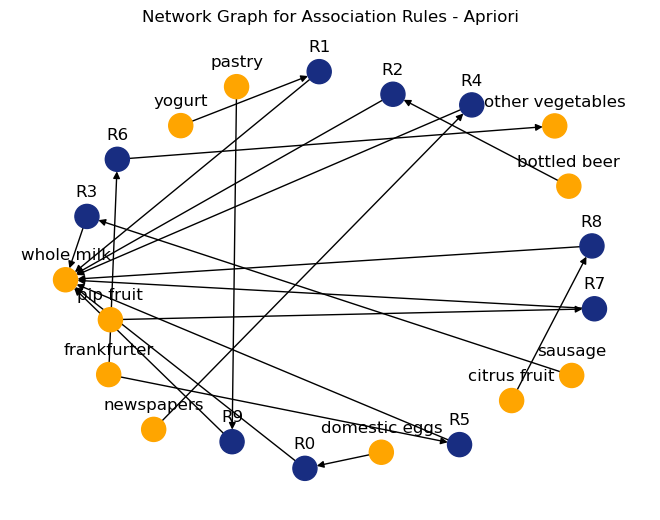

In [146]:
draw_network(rules_ap, 10, 'Apriori')

### FP Growth Algorithm

The technique uses a tree structure to represent the data. This structure is a type of lexicographic tree construction that is called FP-Tree. It is in charge of maintaining the knowledge about associations between the frequently used things.

After creating the FP-Tree, each frequent item is then divided into a series of conditional FP-Trees. It is also possible to mine and measure a collection of conditional FP-Trees independently.

The parameters used in this algorithm are the same used in the Apriori.

In [147]:
from mlxtend.frequent_patterns import fpgrowth

In [148]:
# Evaluate the frequent item rules for fpgrowth function
frequent_itemsets_fp = fpgrowth(basket_sets, min_support = 0.01, use_colnames = True).sort_values("support",ascending=False)
frequent_itemsets_fp.head(10)

C:\Users\vankr\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:111: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.196,(whole milk)
17,0.153,(other vegetables)
15,0.139,(rolls/buns)
3,0.123,(soda)
9,0.109,(yogurt)
24,0.089,(root vegetables)
20,0.086,(tropical fruit)
33,0.078,(bottled water)
4,0.077,(sausage)
47,0.068,(citrus fruit)


In [149]:
# Display the reles due to fp-growth algorithm
rules_fp = association_rules(frequent_itemsets_fp, metric = "confidence", min_threshold = 0.2).sort_values("confidence",ascending=False).reset_index(drop=True)

rules_fp

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(domestic eggs),(whole milk),0.047,0.196,0.011,0.230,1.173,0.002,1.044
1,(yogurt),(whole milk),0.109,0.196,0.024,0.225,1.145,0.003,1.037
2,(bottled beer),(whole milk),0.058,0.196,0.013,0.220,1.121,0.001,1.030
3,(sausage),(whole milk),0.077,0.196,0.016,0.213,1.085,0.001,1.021
4,(newspapers),(whole milk),0.050,0.196,0.011,0.212,1.079,0.001,1.020
5,(frankfurter),(other vegetables),0.049,0.153,0.010,0.210,1.371,0.003,1.072
6,(frankfurter),(whole milk),0.049,0.196,0.010,0.210,1.071,0.001,1.018
7,(pip fruit),(whole milk),0.062,0.196,0.013,0.209,1.067,0.001,1.017
8,(citrus fruit),(whole milk),0.068,0.196,0.014,0.206,1.047,0.001,1.012
9,(pastry),(whole milk),0.066,0.196,0.013,0.204,1.037,0.000,1.009


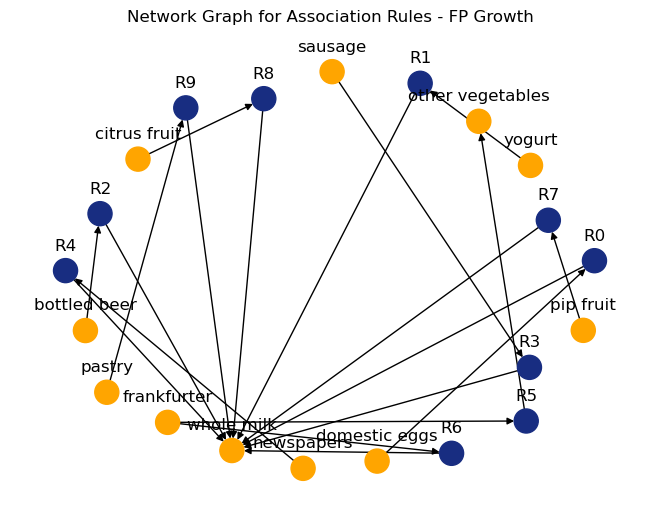

In [150]:
draw_network(rules_fp, 10, 'FP Growth')

## Dashboard

The Dashboard was developed to serve the public 65+.

Elderly people tend to have problems with colour confusion due to declines in contrast sensitivity. Studies point out that people with colour confusion have difficulties in distinguishing colours that present a mixture of green or red. Therefore, for this project, the colour blue was chosen, as it is a primary colour, therefore it will not be influenced by the mixture of colours, in addition to the colour blue being preferred by all age groups, genders and ethnicities. Blue is a restful colour with a calming effect as well as inspiring confidence and security.

Larger sizes were used for fonts, to facilitate visualization.

For the presentation scheme of charts and tables, it was chosen to present one per tab, using the selection scheme, so that they present a larger size, thus facilitating visualization.

As it is a recommendation system, the data was chosen to present information related to book recommendations, so it was chosen to present the most popular books, the most popular authors, the distribution of the age range, the books with the highest average rating by age range and the recommendation system. It was chosen to keep all age groups in the study, firstly because the number of observations was small in this age group, which could affect the recommendation analysis, but also because the elderly person may have different tastes for reading and may also want to use the system to gift someone from another age group, so they can first check the books with the highest ratings in the age group and then use the recommendation system to see book recommendations.


In [151]:
style = {'description_width': 'initial'} 
limit_case = widgets.IntSlider(value=10000, 
                               min=1000, 
                               max=345345,
                               step=1,
                               description='Max Number of Case:',
                               disabled=False,
                               style=style) 

In [152]:
countries=df_books2[df_books2['country'].map(df_books2['country'].value_counts()) > 100] 

unique_country = countries.country.unique()

In [153]:
unique_country

array(['Canada', 'United States', 'Malaysia', 'Brazil', 'Germany',
       'Portugal', 'Australia', 'Netherlands', 'France', 'United Kingdom',
       'Spain', 'Singapore', 'Romania', 'Italy', 'Iran', 'Austria',
       'Belgium', 'Philippines', 'Mexico', 'New Zealand', 'Switzerland',
       'China', 'Japan', 'Ireland', 'Finland', 'Poland', 'Norway',
       'Denmark', 'Sweden', 'Dominican Republic', 'Argentina'],
      dtype=object)

In [154]:
unique_age_range = df_books2.age_range.unique()

In [155]:
unique_age_range = unique_age_range.sort_values()
unique_age_range

['20-', '20 to 40', '40 to 65', '65+']
Categories (4, object): ['20-' < '20 to 40' < '40 to 65' < '65+']

In [156]:
book_title = pd.DataFrame(popular_books(df_books2))
book_title = book_title.sort_values(by='Book_Title')
unique_book_title =  book_title.Book_Title.unique()

In [157]:
unique_book_title

array(['1984', '1st to Die: A Novel', '2nd Chance', 'A Bend in the Road',
       'A Child Called "It": One Child\'s Courage to Survive',
       'A Confederacy of Dunces (Evergreen Book)',
       'A Heartbreaking Work of Staggering Genius',
       'A Is for Alibi (Kinsey Millhone Mysteries (Paperback))',
       'A Lesson Before Dying (Vintage Contemporaries (Paperback))',
       'A Map of the World', 'A Painted House', 'A Prayer for Owen Meany',
       'A Separate Peace',
       "A Thousand Acres (Ballantine Reader's Circle)", 'A Time to Kill',
       'A Walk in the Woods: Rediscovering America on the Appalachian Trail (Official Guides to the Appalachian Trail)',
       'A Walk to Remember', 'A Wrinkle In Time', 'A Wrinkle in Time',
       "ANGELA'S ASHES", 'Airframe', 'All I Really Need to Know',
       'All That Remains (Kay Scarpetta Mysteries (Paperback))',
       'Along Came a Spider (Alex Cross Novels)', 'American Gods',
       'American Psycho (Vintage Contemporaries)',
       "A

In [158]:
country = pn.widgets.Select(options = unique_country.tolist(),
                                  value = 'Canada',
                                  name='Country',
                           )
 

In [159]:
bookTitle = pn.widgets.Select(options = unique_book_title.tolist(),
                                  value = 'The Da Vinci Code',
                                  name='Book Title',
                                  disabled=False,
                                  ) 

In [160]:
age_range = pn.widgets.Select(options = unique_age_range.tolist(),
                                  value = '65+',
                                  name='Age Range',
                           )

In [161]:
country

Select(name='Country', options=['Canada', 'United States'...], value='Canada')

In [162]:
bookTitle

Select(name='Book Title', options=['1984', '1st to Die: A No...], value='The Da Vinci Code')

In [163]:
age_range

Select(name='Age Range', options=['20-', '20 to 40', ...], value='65+')

### Top 5 Books by Age Range

In [164]:
age_range=pn.widgets.Select(name='Age Range', options=unique_age_range.tolist())
@pn.depends(age_range.param.value)
def books_by_age(country):
    df = df_books2.copy()
       
    df_age_range = df.loc[df['age_range']==age_range]           
    agg_book_age = df_age_range.groupby('Book_Title').agg(mean_rating = ('Book_Rating', 'mean'),
                                            number_of_ratings = ('Book_Rating', 'count')).reset_index()
    agg_book_age = agg_book_age.sort_values(by=['number_of_ratings'], ascending=False).reset_index()
    
    top5_age=  agg_book_age.head(5)
    top5_age.drop(columns=['index'], inplace=True)

    return top5_age

### Book Recommendation

In [165]:
def show_image(val):
    return '<img src="{}"'.format(val)

In [166]:
df_books2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267203 entries, 0 to 267202
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   ISBN               267203 non-null  object  
 1   Book_Title         267203 non-null  object  
 2   Book_Author        267203 non-null  object  
 3   Year_Publication   267203 non-null  int64   
 4   Publisher          267203 non-null  object  
 5   Image_URL_S        267203 non-null  object  
 6   Image_URL_M        267203 non-null  object  
 7   Image_URL_L        267203 non-null  object  
 8   User_ID            267203 non-null  int64   
 9   Book_Rating        267203 non-null  int64   
 10  Age                267203 non-null  float64 
 11  age_range          267203 non-null  category
 12  loc                267203 non-null  object  
 13  country            267202 non-null  object  
 14  location           267203 non-null  object  
 15  Lat                267203 non-null

In [167]:
bookTitle = pn.widgets.Select(options = unique_book_title.tolist(), name='Book Title') 

@pn.depends(bookTitle.param.value)
def content_based(bookTitle):
    bookTitle=str(bookTitle)
    
    if bookTitle in df_books2["Book_Title"].values:
        rating_count=pd.DataFrame(df_books2["Book_Title"].value_counts())
        rare_books=rating_count[rating_count["Book_Title"]<=100].index
        common_books=df_books2[~df_books2["Book_Title"].isin(rare_books)]
        
        if bookTitle in rare_books:
            most_common=pd.Series(common_books["Book_Title"].unique()).sample(3).values
            print('There are no recommendations for {0}:'.format(bookTitle))
            print("YOU MAY TRY: \n ")
            print("{}".format(most_common[0]), "\n")
            print("{}".format(most_common[1]), "\n")
            print("{}".format(most_common[2]), "\n")
        else:
            print('Recommendations for {0}:\n'.format(bookTitle))
            common_books=common_books.drop_duplicates(subset=["Book_Title"])
            common_books.reset_index(inplace=True)
            common_books["index"]=[i for i in range(common_books.shape[0])]
            targets=["Book_Title","Book_Author","Publisher"]
            common_books["all_features"] = [" ".join(common_books[targets].iloc[i,].values) for i in range(common_books[targets].shape[0])]
            vectorizer=CountVectorizer()
            common_booksVector=vectorizer.fit_transform(common_books["all_features"])
            similarity=cosine_similarity(common_booksVector)
            index=common_books[common_books["Book_Title"]==bookTitle]["index"].values[0]
            similar_books=list(enumerate(similarity[index]))
            similar_booksSorted=sorted(similar_books,key=lambda x:x[1],reverse=True)[1:6]
            books=[]
            url_=[]
            author_name=[]
            for i in range(len(similar_booksSorted)):
                
                books.append(common_books[common_books["index"]==similar_booksSorted[i][0]]["Book_Title"].item())

            #fig,ax=plt.subplots(1,5,figsize=(8,3))
            #fig.suptitle("YOU MAY ALSO LIKE THESE BOOKS",fontsize=20,color="#182d81")
                
            for i in range(len(books)):
                
                book_name =common_books.loc[common_books["Book_Title"]==books[i],"Book_Title"][:1].values[0]
                url=common_books.loc[common_books["Book_Title"]==books[i],"Image_URL_M"][:1].values[0]
                
                author=common_books.loc[common_books["Book_Title"]==books[i],"Book_Author"][:1].values[0]
                
                author_name.append(author) 
                headers = {'User-Agent' : 
                            'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.5304.107 Safari/537.36'}
                #img=Image.open(requests.get(url,stream=True, headers=headers).raw)
               
                url_.append(url)
                #ax[i].imshow(img)
                #ax[i].axis("off")
                #ax[i].set_title("RATING: {}".format(round(df_books2[df_books2["Book_Title"]==books[i]]["Book_Rating"].mean(),1)),y=-0.20,color="#182d81",fontsize=10)
                #fig.show()
           
            sel_books=pd.DataFrame(books, columns=['Book_Title'], index=[1, 2, 3, 4, 5])
            sel_url=pd.DataFrame(url_, columns=['cover'], index=[1, 2, 3, 4, 5])
            sel_author=pd.DataFrame(author_name, columns=['Author'], index=[1, 2, 3, 4, 5])
            sel_books = pd.merge(sel_books, sel_author, left_index=True, right_index=True)
            sel_books = pd.merge(sel_books, sel_url,  left_index=True, right_index=True)
            

            
    
    else:
        print("CAN NOT FIND ") 
    
    return pn.Row(pn.Column('### YOU MAY ALSO LIKE THESE BOOKS:', sel_books.style.format({'cover' : show_image}), width =900))

In [168]:
content_based('The Da Vinci Code')

Recommendations for The Da Vinci Code:



Row
    [0] Column(width=900)
        [0] Markdown(str)
        [1] DataFrame(Styler)

### Top5 Popular Books by Country

In [169]:
def get_map(zoom_start=5):
    return folium.Map(zoom_start=zoom_start)
map = get_map()


In [170]:
# Designing the popup for the map
def popup_html(row, df): 
    
    i = row
    

    book_html = df['Book_Title'].iloc[i]
    cover_html = df_books2.loc[df_books2["Book_Title"]==df["Book_Title"].tolist()[i],"Image_URL_L"][:1].values[0]
    author_html = df_books2.loc[df_books2["Book_Title"]==df["Book_Title"].tolist()[i],"Book_Author"][:1].values[0]
    
    left_col_color = '#182d81'
    right_col_color = '#c6d0fb'

    html = """
    <!DOCTYPE html>
    <html>
    <center><img src = \"""" + cover_html + """\" alt = "logo" width=100 ></center>
    <center> <table style = "height: 100px; width: 200px;">
    <tbody>
    </tr>
    <tr>
    <td style="background-color: """ + left_col_color + """;"><span style="color: #ffffff;"> Book Title </span></td>
    <td style="width: 100px;background-color: """ + right_col_color + """;">{}</td>""".format(book_html) + """
    </tr>
    <tr>    <td style="background-color: """ + left_col_color + """;"><span style="color: #ffffff;"> Author </span></td>
    <td style="width: 100px;background-color: """ + right_col_color + """;">{}</td>""".format(author_html) + """
    </tr>
    <tr>
    </tbody>
    </table></center>
    </html>
    """
    return html

In [171]:
def get_df_country(country):
    df = df_books2.copy()
    df_country = df.loc[df['country']==country]
    return df_country.reset_index(drop=True)


In [172]:
def add_books(map, country, df)  :
    
    df_1 = df_books2.copy()
    df_country = df_1.loc[df_1['country']==country]
    
   
    incidents = plugins.MarkerCluster().add_to(map)

    for i, row in df.iterrows():
        lat=df_country.loc[df_country["Book_Title"]==df["Book_Title"].tolist()[i],"Lat"][:1].values[0]
        lng=df_country.loc[df_country["Book_Title"]==df["Book_Title"].tolist()[i],"Long"][:1].values[0]
        icon_color='blue'
        folium.Marker(location=[lat, lng],
                      popup=folium.Popup(folium.Html(popup_html(i, df), script = True)),
                      icon = None).add_to(incidents)


In [173]:
def get_top5(df):
    top5 = df.head(5)
    return top5.reset_index(drop=True)

In [174]:
class PanelFoliumMap(param.Parameterized):
    
    country = param.Selector(default='Canada', objects=unique_country.tolist()) 

    def __init__(self, **params):
        super().__init__(**params)
        self.map = get_map()
        self.folium_pane = pn.pane.plot.Folium(sizing_mode="stretch_both", min_height=600, margin=0)    
        self.view = pn.Column(
            self.param.country,
            self.folium_pane,
            sizing_mode="stretch_both", height=400, width=400
        )
        self._update_map()

    @param.depends('country', watch=True)
    def _update_map(self):
        self.map = get_map()
        country = self.country
        df_country = get_df_country(country)
        df_pop = popular_books(df_country)
        df_top_five = get_top5(df_pop)
        add_books(self.map, country, df_top_five)
        self.folium_pane.object = self.map
    
pn.Param(PanelFoliumMap.param, widgets={
    'country': pn.widgets.Select})        
    
app = PanelFoliumMap()
app.view

Param(ParameterizedMetaclass, name='PanelFoliumMap', widgets={'country': <class '...})

Column(height=400, sizing_mode='stretch_both', width=400)
    [0] Select(name='Country', options=OrderedDict([('Canada', ...]), value='Canada')
    [1] Folium(Map, margin=0, min_height=600, sizing_mode='stretch_both')

### Top 10 Popular Author by Country

In [175]:
country=pn.widgets.Select(name='Country', options=unique_country.tolist())

@pn.depends(country.param.value)
def rec_country(country):
    df = df_books2.copy()
       
    df_country = df.loc[df['country']==country]
           
    top_five=pd.DataFrame(popular_books(df_country)).head(5)
    book_top=[]
    for i in range(len(top_five["Book_Title"].tolist())):
        book_name=df_country.loc[df_country["Book_Title"]==top_five["Book_Title"].tolist()[i],"Book_Title"][:1].values[0]
        book_top.append(book_name)

# Aggregate by author
    agg_author_country = df_country.groupby('Book_Author').agg(mean_rating = ('Book_Rating', 'mean'),
                                            number_of_ratings = ('Book_Rating', 'count')).reset_index()
    top10_author_country=pd.DataFrame(popular_author(agg_author_country)).head(10)
    
    chart_t10 = top10_author_country.hvplot(x="Book_Author", y="Score", size=80, kind='bar', color='#182d81', rot=45)
    chart_t10.opts(ylim=(5, max(top10_author_country['Score'])))

    return pn.Row(pn.Column(chart_t10, sizing_mode='stretch_width'))

### Top 5 Books By Age Range

In [176]:
age_range=pn.widgets.Select(name='Age Range', options=unique_age_range.tolist())
@pn.depends(age_range.param.value)
def book_by_age(age_range):   

    df = df_books2.copy()
    df_age_range = df.loc[df['age_range']==age_range] 
    
    agg_book_age = df_age_range.groupby('Book_Title').agg(mean_rating = ('Book_Rating', 'mean'),
                                            number_of_ratings = ('Book_Rating', 'count')).reset_index()
    agg_book_age = agg_book_age.sort_values(by=['number_of_ratings'], ascending=False).reset_index()
    
    top5_age=  agg_book_age.head(5)
    top5_age.drop(columns=['index'], inplace=True)
    top5_age = pd.DataFrame(top5_age, index=[1,2,3,4,5])
    top5_age
    
    return pn.Row(pn.Column(top5_age, width =900))

### Age Distribution

In [177]:
chart_age_range = agg_age_range.hvplot.bar("age_range", "number_of_ratings", color='#182d81', rot=45, width=900)

### Rating Distribution

In [178]:
agg_rating = df_books2.groupby('Book_Rating').agg(number_of_ratings = ('Book_Rating', 'count')).reset_index()

In [179]:
chart_rating = agg_rating.hvplot.bar('Book_Rating', 'number_of_ratings', color='#182d81', rot=45, width=900)

## Building Dashboard

In [180]:
viz_button = pn.widgets.RadioBoxGroup(options=['Top 5 Popular Books by Country', 'Top 10 Popular Author by Country', 'Age Range Distribution', 'Rating Distribution', 'Top 5 Book Distribution by Age Range', 'Book Recommendation'], inline=False)

In [181]:
@pn.depends(viz_button)
def viz_recommedation(x):
    if x == 'Top 5 Popular Books by Country':
        return pn.Column('# Top 5 Popular Books by Country', app.view, width=900, height=600)
    elif x == 'Top 10 Popular Author by Country':
        return pn.Column('# Top 10 Popular Author by Country',country, rec_country)
    elif x == 'Age Range Distribution':
        return pn.Column('# Age Range Distribution', chart_age_range)
    elif x == 'Rating Distribution':
        return pn.Column('# Rating Distribution', chart_rating)
    elif x == 'Top 5 Book Distribution by Age Range':
        return pn.Column('# Top 5 Book by Age Range', age_range, book_by_age)
    elif x == 'Book Recommendation':
        return pn.Column('# Book Recommendation', bookTitle, content_based, height=1200)


In [182]:
book_img = pn.pane.JPG('https://www.vmtlib.michlibrary.org/images/library-books.jpg', width=300)

In [183]:
template = pn.template.FastListTemplate(
    title='Recommendation System Dashboard',
    sidebar=[book_img,
             pn.pane.Markdown("## Book Recommedation Analysis"),
             viz_button],
    main=[pn.Row(pn.Column(viz_recommedation))
          ],
    accent_base_color='#182d81',
    header_background='#182d81'
)
#template show
template.servable();

C:\Users\vankr\anaconda3\lib\site-packages\panel\pane\base.py:38: DeprecationWarning: panel.Pane(...) is deprecated, use panel.panel(...) instead.
  warnings.warn(


In [184]:
template.show()

Launching server at http://localhost:55979


#### This image shows the Dashboard

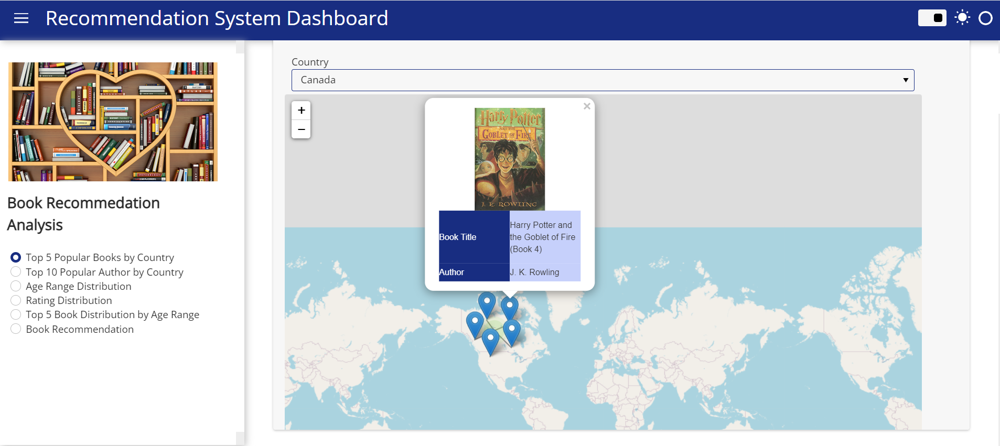

## Conclusion

For the visualization system, popularity based, content based and collaboration item and user based systems were developed. In this report, only the content-based system and the collaborative item system were presented, due to the limited word limit for the referred report, it would not be possible to explain the analyses of the other models. The analyses of all of them are described in the jupyter notebook file. To compose the report, the collaborative item system was chosen, as I believe that it is easier to choose an item to analyse the recommendation than to choose a user, given that by a number it is not possible to know the characteristics of the person.

For the market basket analysis, the two algorithms present similar results, so the choice of using one method and the other differs due to the processing time given that Apriori performs the process locally and FP Growth virtually. For the given study, it did not show much difference, as it dealt with a relatively small dataset.

Many challenges were found for the dashboard, starting with data preparation, because the location information, for example, was misconfigured, which took some time to adjust. Another point was the assimilation and decision of which library to use to generate a dashboard. In addition to demanding a lot of time to understand how some libraries work together with the library dashboard.
